# Improving Clustering and Experimenting 3
In this noteboook we aim to improve the baseline model we built.

We will do the following:
* Find the incremental variable that gives clusters the spiral shape 
* Use PCA 
* Try clustering without demographic data
* try other algorithms 
* describe difference between clusters better 

## Prep

In [1]:
# imports
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt 
import sklearn 
from sklearn.cluster import KMeans as k_means_sklearn
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.model_selection import GridSearchCV
from  scipy.cluster.vq import kmeans 
from  scipy.cluster.vq import cdist
from sklearn.metrics import silhouette_score
from mpl_toolkits.mplot3d import Axes3D
import sys
import warnings
if not sys.warnoptions:
    warnings.simplefilter("ignore")
from wordcloud import WordCloud

In [2]:
data=pd.read_csv("checkpoint_final_depaul_scored.csv")
data_orginal=pd.read_csv("data_pooled_cleaned.csv")

In [10]:
phq=[i for i in data_orginal.columns if "phq" in i][:-1]
data["phq_score"]=data_orginal[phq].sum(axis=1)

In [15]:
depression=[i for i in data.columns if "depression" in i][2:]
data.drop(depression,inplace=True,axis=1)

In [21]:
[i for i in data_orginal.columns if "start" in i]

([' Only for a few days at the start of infection_other_12',
  'symptoms_start_time_covid'],
 [])

In [23]:
[i for i in data_orginal.columns if "symptoms" in i]

[' Traumatic Brain Injury (TBI) or TBI-like symptoms_other_0',
 ' : I have no memory symptoms_other_3',
 ' I did NOT have any Brain Fog symptoms_other_5',
 'I did NOT have any Brain Fog symptoms_other_5',
 'None of the below gastrointestinal symptoms apply to me_other_25',
 'None of the below respiratory and sinus symptoms apply to me_other_27',
 'None of the below skin and allergy symptoms apply to me_other_29',
 ' Other ear/hearing symptoms_other_34',
 'Other ear/hearing symptoms_other_34',
 ' Vision symptoms - Double vision_other_36',
 ' Vision symptoms - Sensitivity to light_other_36',
 ' Vision symptoms - Total loss of vision_other_36',
 ' Vision symptoms - Tunnel vision_other_36',
 'Vision symptoms - Blurred vision_other_36',
 'Vision symptoms - Double vision_other_36',
 'Vision symptoms - Sensitivity to light_other_36',
 'Vision symptoms - Total loss of vision_other_36',
 'Vision symptoms - Tunnel vision_other_36',
 'symptoms_start_time_covid',
 'symptoms_persistance_covid',
 'd

In [24]:
data["days_with_symptoms_covid"]

0       0.512500
1       0.259259
2       0.512500
3       0.512500
4       0.370370
          ...   
2436    0.777778
2437    0.148148
2438    0.370370
2439    0.259259
2440    0.111111
Name: days_with_symptoms_covid, Length: 2441, dtype: float64

In [27]:
12*7

84

In [30]:
len(data_orginal)

2441

In [42]:
#4 weeks 
sum(data_orginal["days_with_symptoms_covid"]>=28)/len(data)*2441

186.0

In [41]:
# 12 weeks
sum(data_orginal["days_with_symptoms_covid"]>=84)/len(data)*2441

16.0

In [40]:
# 2 weeks 
sum(data_orginal["days_with_symptoms_covid"]>=14)/len(data)*100

40.024580090126996

In [16]:
sum(data_orginal["days_with_symptoms_covid"]>=28)/len(data)*100

Index(['Unnamed: 0', 'PatientID', 'other_43', 'other_50',
       ' Acute myelitis_other_0', ' Autoimmune encephalitis _other_0',
       ' Blood clot_other_0', ' Bone problems. Arthritis _other_0',
       ' Costochondritis_other_0', ' Cranial nerve involvement_other_0',
       ...
       'Yes.40', 'missing.39', 'No.40', 'Yes.41', 'missing.40', 'No.41',
       'Yes.42', 'missing.41', 'depaul_one_hundred_point', 'phq_score'],
      dtype='object', length=944)

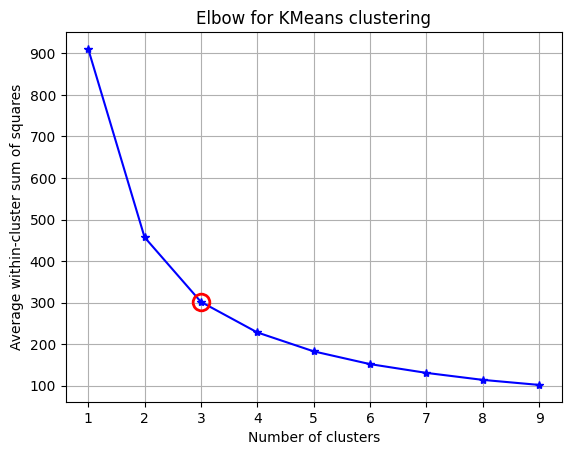

In [3]:

### how many clusters? a common empirical method is elbow method


##a quick yet amazing implementation I grapbbed from stackoverflow response:
#here https://stackoverflow.com/questions/6645895/calculating-the-percentage-of-variance-measure-for-k-means


##### cluster data into K=1..10 clusters #####
def elbow_method(X):
    K = range(1,10)

    # scipy.cluster.vq.kmeans
    KM = [kmeans(X,k) for k in K]
    centroids = [cent for (cent,var) in KM]   # cluster centroids
    #avgWithinSS = [var for (cent,var) in KM] # mean within-cluster sum of squares

    # alternative: scipy.spatial.distance.cdist
    D_k = [cdist(X, cent, 'euclidean') for cent in centroids]
    cIdx = [np.argmin(D,axis=1) for D in D_k]
    dist = [np.min(D,axis=1) for D in D_k]
    avgWithinSS = [sum(d)/X.shape[0] for d in dist]

    ##### plot ###
    kIdx = 2

    # elbow curve
    fig = plt.figure()
    ax = fig.add_subplot(111)
    ax.plot(K, avgWithinSS, 'b*-')
    ax.plot(K[kIdx], avgWithinSS[kIdx], marker='o', markersize=12, 
        markeredgewidth=2, markeredgecolor='r', markerfacecolor='None')
    plt.grid(True)
    plt.xlabel('Number of clusters')
    plt.ylabel('Average within-cluster sum of squares')
    plt.title('Elbow for KMeans clustering')
elbow_method(np.array(data))

In [4]:
def baseline_kmeans(X,n_clusters):
    ### first build our first kmeans with the data as is 
    model=k_means_sklearn(n_clusters=n_clusters,random_state=42,max_iter=300)
    labels=model.fit_predict(X)
    #print(f"Silhoute score: {silhouette_score(X,labels)}")
    #data["cluster"]=labels
    return labels,silhouette_score(X,labels)


In [5]:
from matplotlib import cm

In [6]:
def tsne_3_2(X,data,ax,which="both"):
    if which=="both":
        tsne2d=TSNE(n_components=2)
        tsne3d=TSNE(n_components=3)
        data_2d=tsne2d.fit_transform(X)
        data_3d=tsne3d.fit_transform(X)
    elif which=="3d_only":
        tsne2d=None
        tsne3d=TSNE(n_components=3)
        data_3d=tsne3d.fit_transform(X)
         ### 3d plot
        sns.set(style = "darkgrid")
        plt.style.use("ggplot")
        %matplotlib osx
        fig = plt.figure(figsize=(30,20))
        ax = fig.add_subplot(111, projection = '3d')
        ax.scatter(data_3d[:,0],data_3d[:,1],data_3d[:,2],c=data["cluster"],cmap=cm.Dark2)
    elif which=="2d_only":
        tsne3d=None
        tsne2d=TSNE(n_components=2)
        data_2d=tsne2d.fit_transform(X)
        ax.scatter(data_2d[:,0],data_2d[:,1],c=data["cluster"],cmap=cm.Dark2)
                             
        




In [7]:
def compare_cluster(var,df):
    cluster0=df[df.cluster==0]
    cluster1=df[df.cluster==1]
    cluster2=df[df.cluster==2]
    if len(data_orginal.cluster.unique())==4:
        cluster3=data_orginal[data_orginal.cluster==3]
    if pd.api.types.is_numeric_dtype(df[var]):
        print(f"Mean of cluster 0 is {np.mean(cluster0[var]):.2f} +/- {np.std(cluster0[var]):.2f}")
        print(f"Mean of cluster 1 is {np.mean(cluster1[var]):.2f} +/- {np.std(cluster1[var]):.2f}")
        print(f"Mean of cluster 2 is {np.mean(cluster2[var]):.2f} +/- {np.std(cluster2[var]):.2f}")
        sns.barplot(df["cluster"],df[var])
    elif pd.api.types.is_object_dtype(df[var]):
        print("Cluster 0\n")
        print(cluster0[var].value_counts()/len(cluster0))
        print("Cluster 1\n")
        print(cluster1[var].value_counts()/len(cluster1))
        print("Cluster 2\n")
        print(cluster2[var].value_counts()/len(cluster2))
        

def count_dummy_per_cluster(section,n,top=10,type="bar"):
    clusters=[]
    for i in range(n):
        print(n)
        clus=data_orginal[data_orginal.cluster==n]
        clusters.append(clus)
        
    cols=[x for x in data_orginal.columns if section in x]
    dummy_cols=[]
    for col in cols:
        if data_orginal[col].nunique()<=2 and pd.api.types.is_numeric_dtype(data_orginal[col]):
            dummy_cols.append(col)
    
    for e,cluster in enumerate(clusters):
        plt.figure(figsize=(30,10))
        ax=plt.subplot(1,n,e+1)
        summs={}
        for col in dummy_cols:
            if "None of" in col or "do not" in col or "don't have" in col or "no" in col.lower():
                pass
            else:
                try:
                    col_name=col.replace(section,"")
                    summs[col_name]=np.sum(cluster[col])
                    summs={k: v for k, v in sorted(summs.items(), key=lambda item: item[1],reverse=True)}
                except:
                    pass
        print(len(cluster))
        print(cluster.cluster.nunique())
        print(summs)
        if type=="bar":
            ax.bar(list(summs.keys())[:top],height=list(summs.values())[:top])
            ax.set_title(f"Cluster{e}")
            ax.set_xticks(list(summs.keys())[:top],rotation=90)
            plt.xticks(rotation=90)
            plt.show()
        else:
            wordcloud = WordCloud(width=900,height=500, max_words=1628,relative_scaling=1,normalize_plurals=False).generate_from_frequencies(summs)
            ax.imshow(wordcloud, interpolation='bilinear')
            plt.axis("off")
            ax.set_title(f"Cluster{e}")
            plt.show()
            
def pie_cluster(var,data=data_orginal,n=3):
    cluster0=data_orginal[data_orginal.cluster==0]
    cluster1=data_orginal[data_orginal.cluster==1]
    cluster2=data_orginal[data_orginal.cluster==2]
    clusters=[cluster0,cluster1,cluster2]
    if n==4:
        cluster3=data_orginal[data_orginal.cluster==3]
        clusters.append(cluster3)
    for e,cluster in enumerate(clusters):
        plt.figure(figsize=(30,10))
        ax=plt.subplot(1,n,e+1)
        keys=list(cluster[var].value_counts().keys())
        values=list(cluster[var].value_counts().values)
        plt.pie(values,labels=keys)
        ax.set_title(f"Cluster{e}")
    
    
def compare_cat_per_cluster(section,index):
    cluster0=data_orginal[data_orginal.cluster==0]
    cluster1=data_orginal[data_orginal.cluster==1]
    cluster2=data_orginal[data_orginal.cluster==2]
    clusters=[cluster0,cluster1,cluster2]
    #cols=[x for x in data_orginal.columns if section in x]
    col=cols[index]
    plt.figure(figsize=(30,10))
    for e,cluster in enumerate(clusters):
        ax=plt.subplot(1,3,e+1)
        #print(summs)
        ax.bar(data_orginal[col])[:20]
        ax.set_title(f"Cluster{e}")
        plt.xticks(rotation=90)
    
    plt.show()
    

In [8]:
def read_data(remove_incremental=True):
    data=pd.read_csv("checkpoint_final_depaul_scored.csv")
    data_orginal=pd.read_csv("data_pooled_cleaned.csv")
    if remove_incremental==True:
        data.drop(['Unnamed: 0', 'PatientID'],inplace=True,axis=1)
    return data,data_orginal

def remove_section(section,data,data_orginal=data_orginal):
    print(data.shape)
    cols=[x for x in data_orginal.columns if section in x]
    for col in cols:
        vs=[]
        if pd.api.types.is_object_dtype(data_orginal[col]):
            try:
                vs=list(data_orginal[col].unique())
                vs.remove(np.nan)
                data.drop(vs,axis=1,inplace=True)
            except:
                pass
        elif pd.api.types.is_numeric_dtype(data_orginal[col]):
            if col in data.columns:
                data.drop(col,axis=1,inplace=True)
        ##remove dummies
    col_dummies=[x for x in data.columns if f"_{section}" in x]
    data.drop(col_dummies,axis=1,inplace=True)
    print(data.shape)
            
            

def prep_comparision(labels,data_orginal=data_orginal):
    data_orginal["cluster"]=labels
    return data_orginal
def preferred_dimensions(X):
    pca = PCA()
    pca.fit(X)
    cumsum = np.cumsum(pca.explained_variance_ratio_)
    d = np.argmax(cumsum >= 0.95) + 1
    #print(f"Preferrable dimension with largest variance = {d}")
    pca = PCA(n_components=0.95) 
    X_reduced = pca.fit_transform(X)
    return X_reduced

In [9]:
data_orginal

,PatientID,other_1,other_2,other_4,other_7,other_9,other_11,other_13,other_14,other_17,...,persistent_fatigue_depaul,headaches_depaul,fatigue_duration_depaul,MEC_diagnosis_depaul,MEC_diagnosis_year_depaul,diagnosis_type_depaul,diagnosis_by_depaul,current_MEC_diagnosis_depaul,family_MEC_diagnosis_depaul,phq_score
0,0,NaN,No,No,No,No,Yes,No,Yes,No,...,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,severe depression
1,1,After COVID-19 infection,Yes,Yes,No,No,No,No,No,No,...,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,moderately severe depression
2,2,Unrelated to COVID,No,No,No,No,No,No,No,No,...,Not having a problem with fatigue/energy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,moderate depression
3,3,Unrelated to COVID,No,No,No,No,No,No,Yes,No,...,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,moderate depression
4,4,After COVID-19 infection,No,No,No,No,Yes,No,No,No,...,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no depression
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2436,2565,NaN,No,No,No,Yes,Yes,No,Yes,No,...,Not having a problem with fatigue/energy,Not having a problem with fatigue/energy,Not having a problem with fatigue/energy,No,NaN,NaN,NaN,No,No,no depression
2437,2567,After COVID-19 infection,Yes,Yes,No,Yes,Yes,No,Yes,No,...,Yes,Yes,6-12 months,No,2021-09-30,After COVID-19 vaccine,Medical Doctor,Yes,No,moderate depression
2438,2568,After COVID-19 infection,Yes,Yes,No,Yes,No,No,Yes,NaN,...,Yes,Yes,6-12 months,Yes,2021-04-15,After COVID-19 infection,Medical Doctor,Yes,No,moderate depression
2439,2569,NaN,Yes,Yes,No,Yes,No,No,Yes,No,...,Yes,Yes,Less than 6 months,No,NaN,NaN,NaN,Yes,No,moderate depression


In [10]:
len(data),len(data_orginal)

(2441, 2441)

In [11]:
from sklearn.cluster import Birch,AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from tqdm import tqdm

# Experimenting

In [12]:
section_removed_arrays={}
section_removed_dfs={}
# experimenting removing different sections with different algorithmns 
sections=["other","mos","covid","phq","treatment","depaul","demo"]

for section in sections:
    print(section)
    data,data_orginal=read_data()
    remove_section(section,data)
    X=np.array(data)
    x_compressed=preferred_dimensions(X)
    section_removed_arrays[section]=x_compressed
    section_removed_dfs[section]=data
    

other
(2441, 947)
(2441, 437)
mos
(2441, 947)
(2441, 945)
covid
(2441, 947)
(2441, 832)
phq
(2441, 947)
(2441, 947)
treatment
(2441, 947)
(2441, 891)
depaul
(2441, 947)
(2441, 944)
demo
(2441, 947)
(2441, 871)


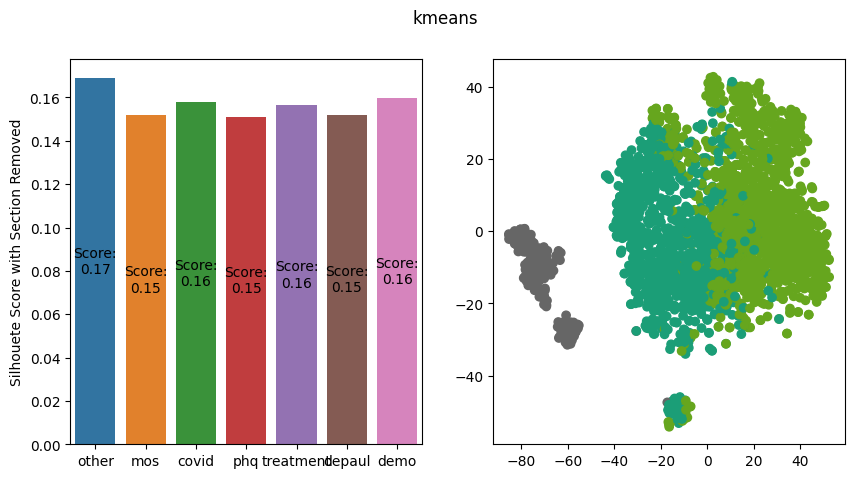

Avg score 0.15685220829522903


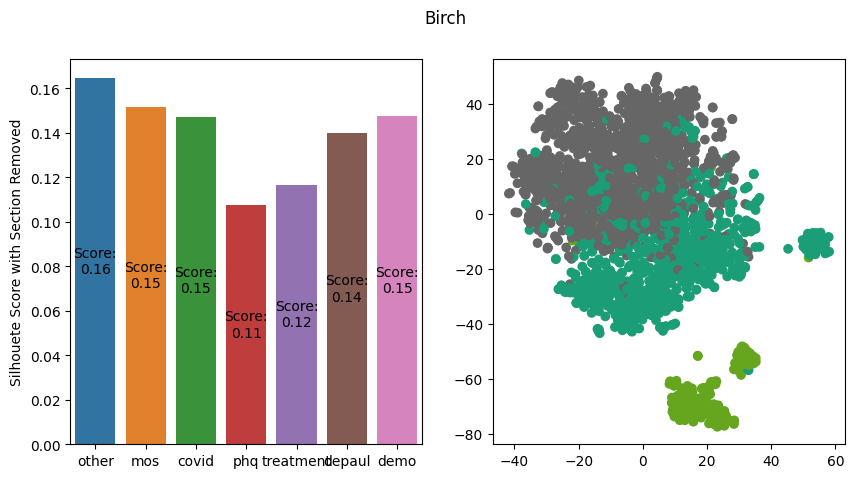

Avg score 0.13934561564678097


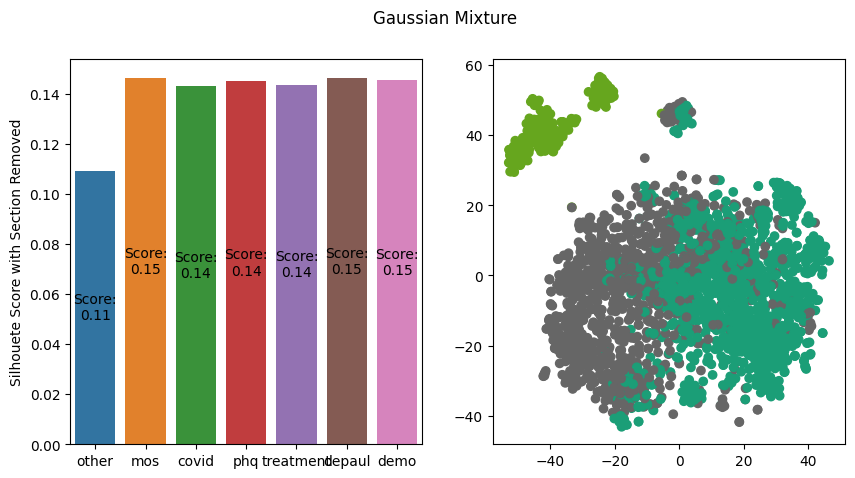

Avg score 0.13976685656291982


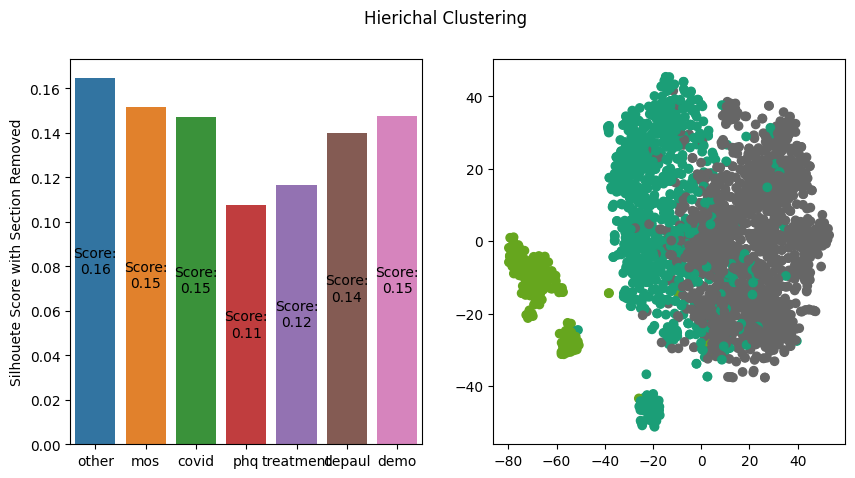

Avg score 0.13934561564678097


In [13]:
models={"kmeans":k_means_sklearn(n_clusters=3),"Birch":Birch(n_clusters=3),
        "Gaussian Mixture":GaussianMixture(n_components=3),
        "Hierichal Clustering":AgglomerativeClustering(n_clusters=3)}
labels_model={}
for name,model in models.items():
    results={}
    for section,array in section_removed_arrays.items():
        model = model
        try:
            labels=model.fit_predict(array)
        except:
            model.fit(array)
            labels=model.predict(array)
        sil_score=silhouette_score(array,labels)
        results[section]=sil_score
    fig, (ax,ax2) = plt.subplots(figsize=(10,5),ncols=2)
    sns.barplot(x=list(results.keys()), y=list(results.values()), capsize=0.2, ax=ax)
    ax.bar_label(ax.containers[-1], fmt='Score:\n%.2f', label_type='center')
    ax.set_title("")
    ax.set(ylabel='Silhouete Score with Section Removed')
    data,data_orginal=read_data(remove_incremental=True)
    data_orginal=prep_comparision(labels)
    tsne_3_2(x_compressed,data_orginal,ax=ax2,which="2d_only")
    plt.suptitle(name)
    plt.show()
    print(f"Avg score {np.mean(list(results.values()))}")
    #count_dummy_per_cluster("other",3,type="cloud")
    #pie_cluster("phq_score")
    #pie_cluster("Type of the vaccine_treatment")
    labels_model[name]=labels
    
    

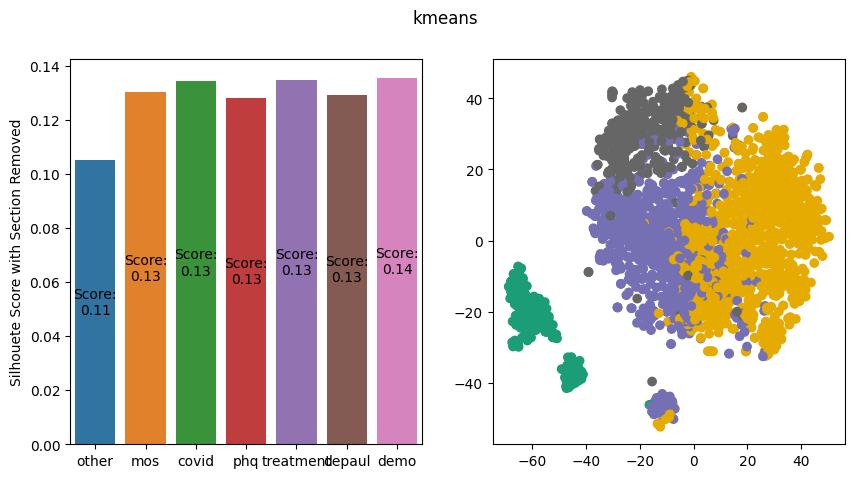

Avg score 0.12836051830435438


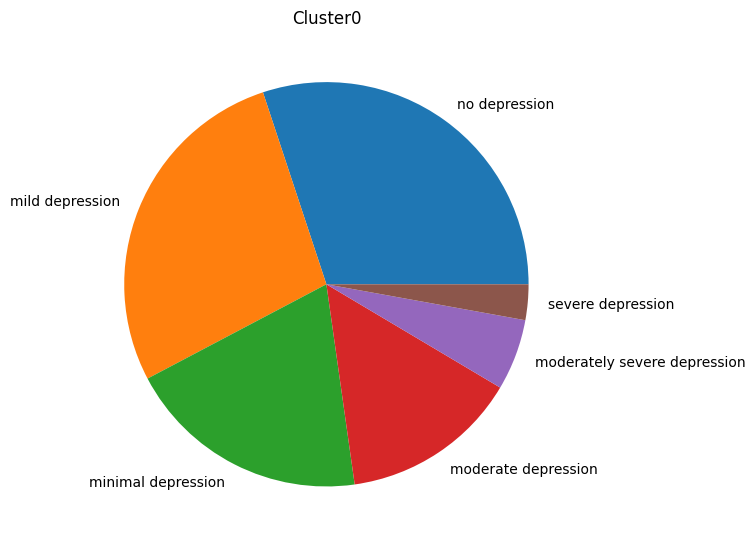

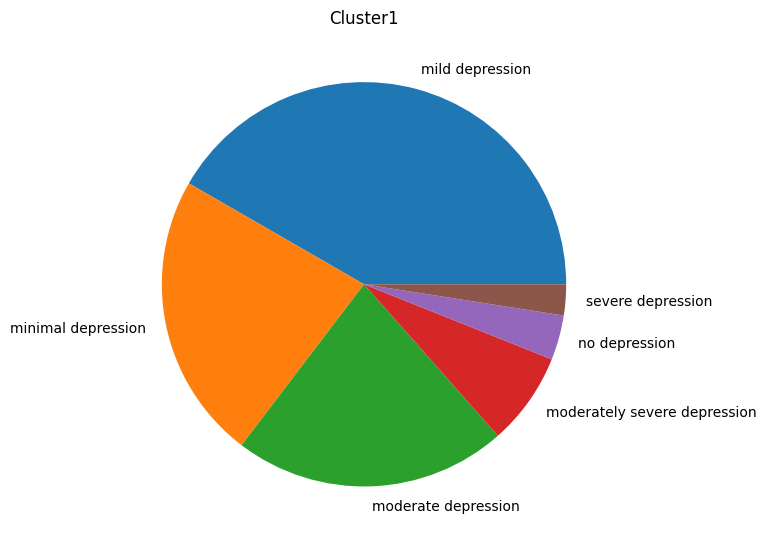

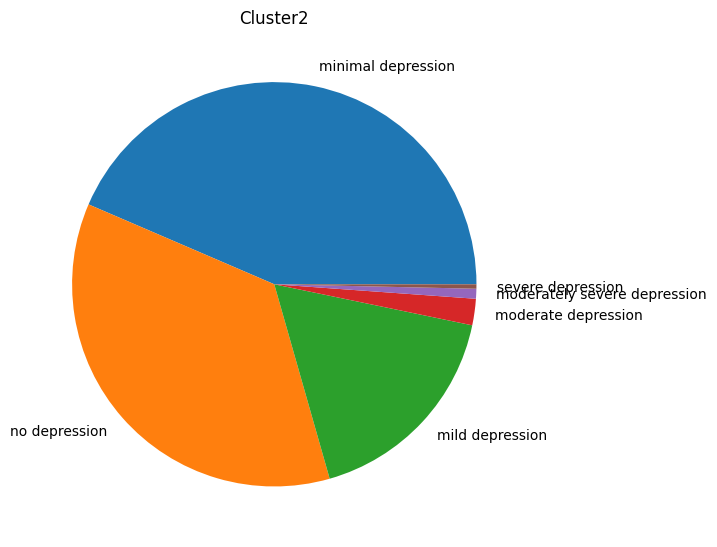

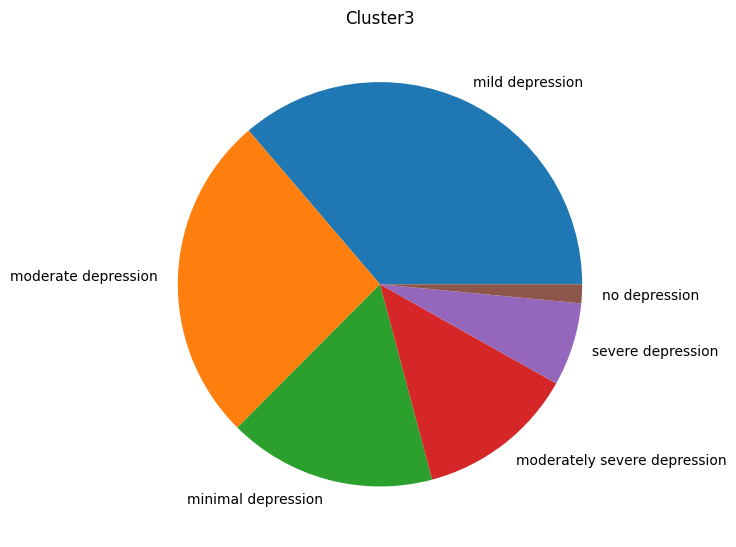

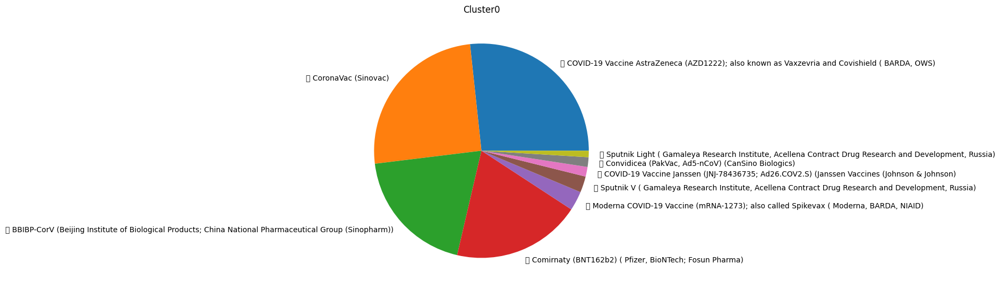

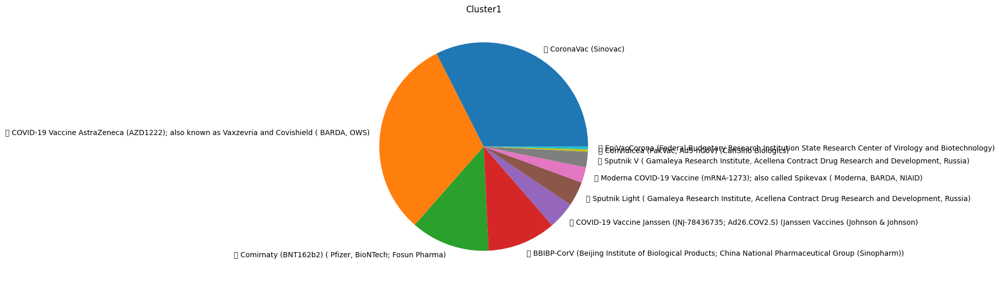

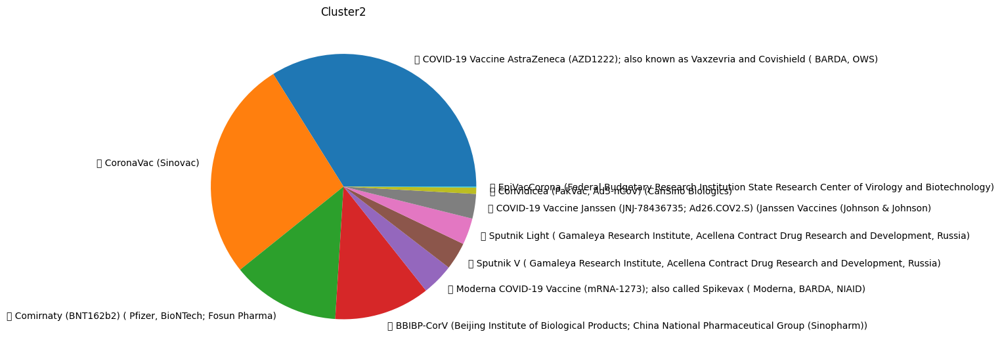

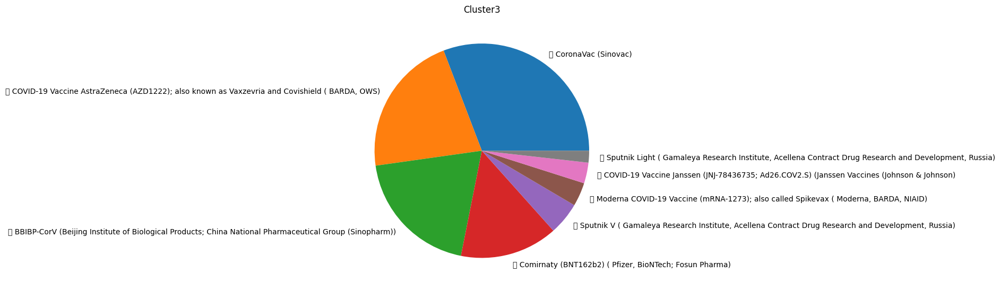

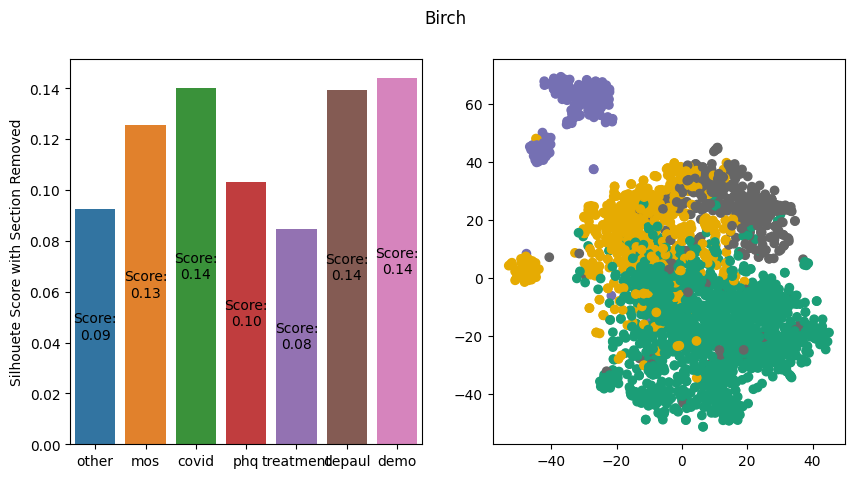

Avg score 0.11846403048298663


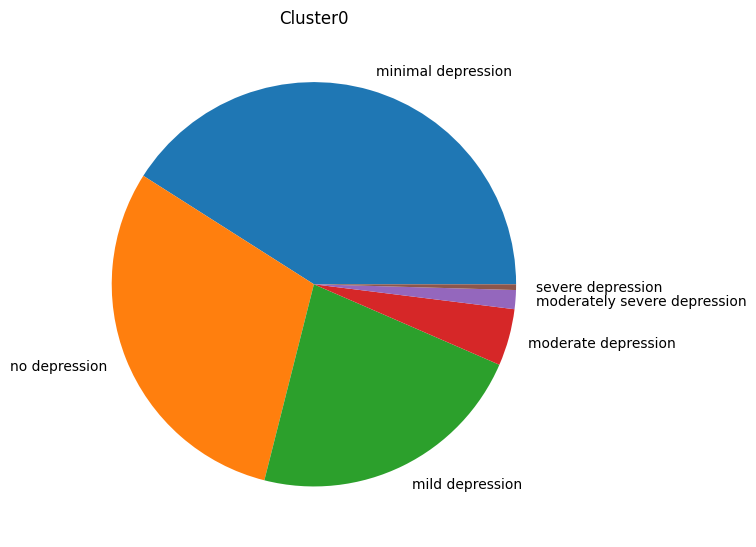

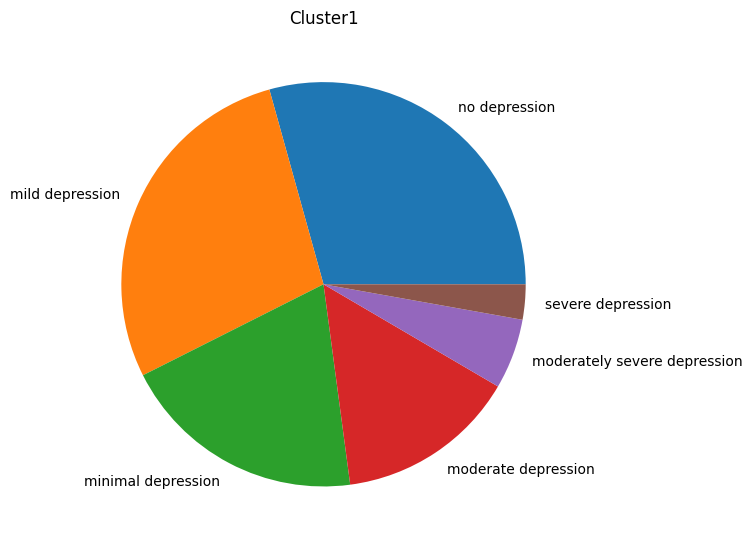

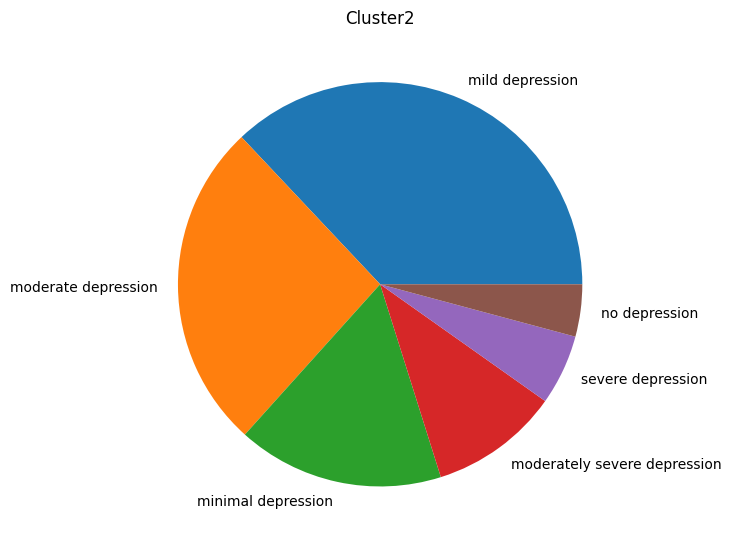

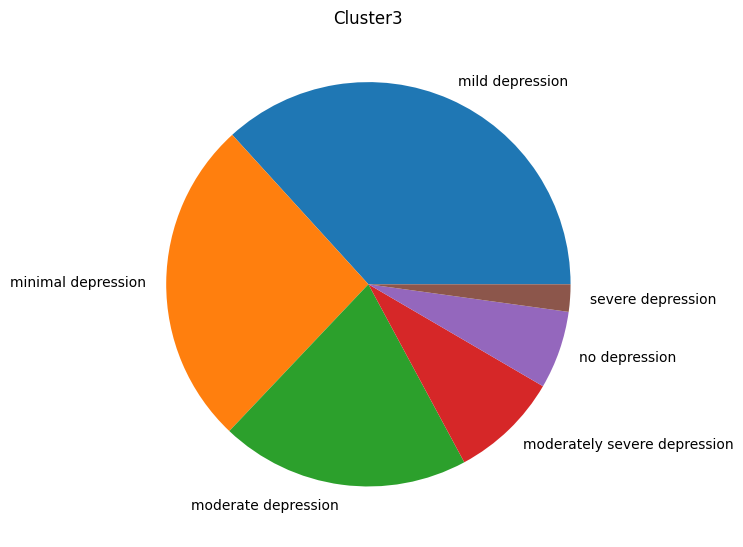

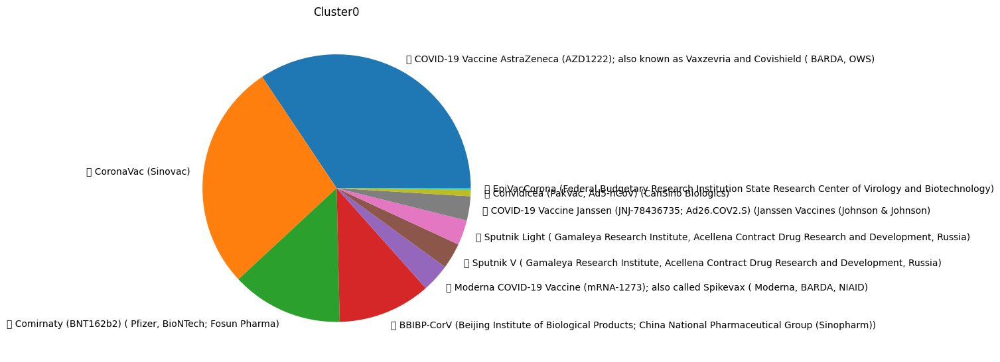

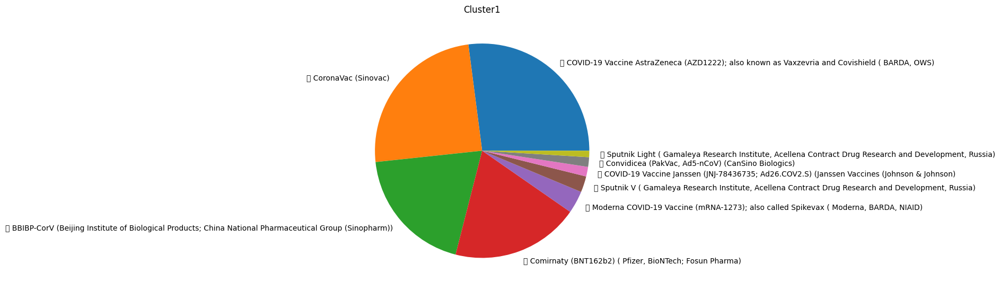

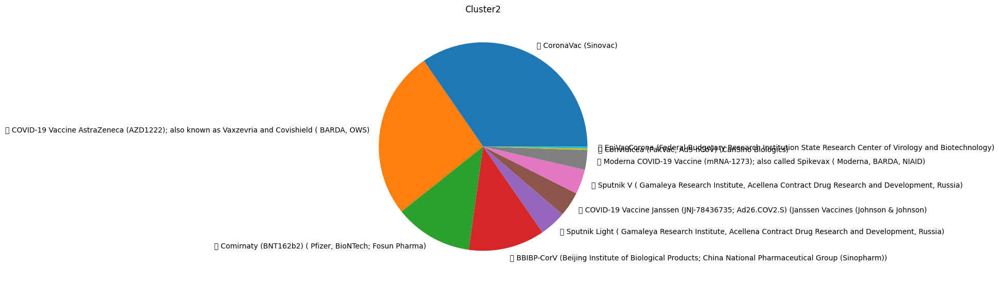

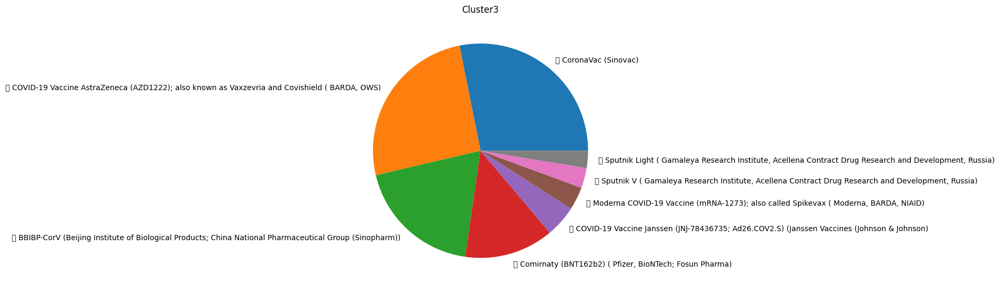

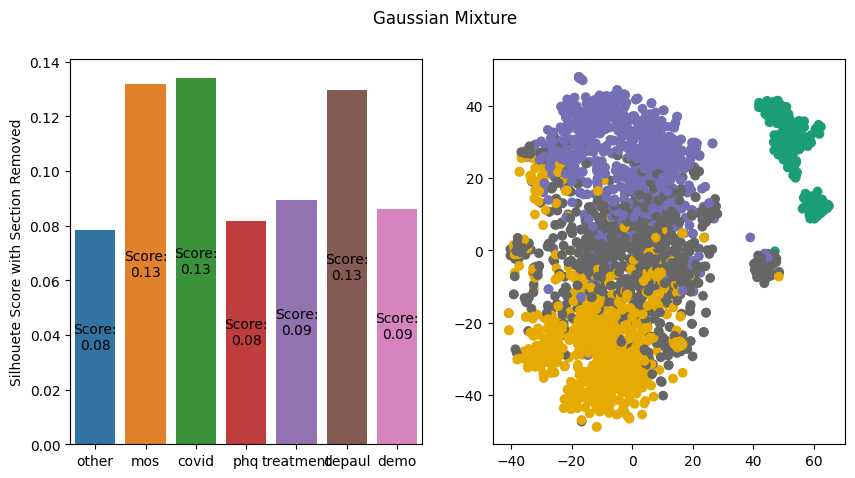

Avg score 0.10452834558084848


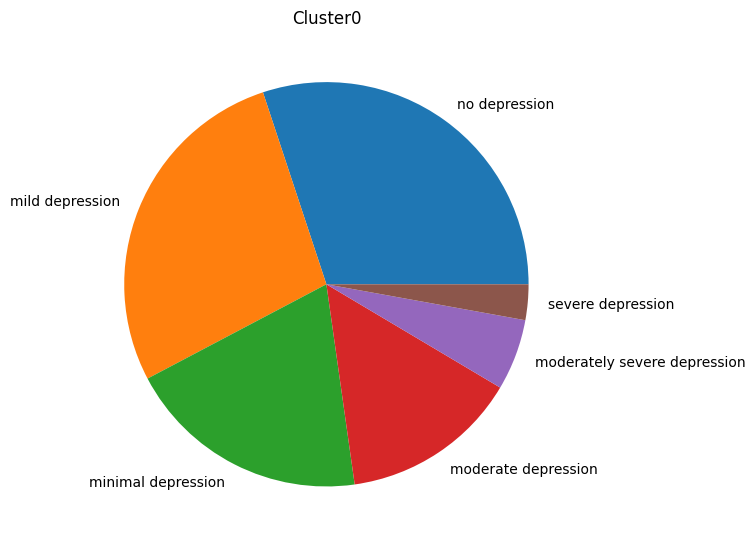

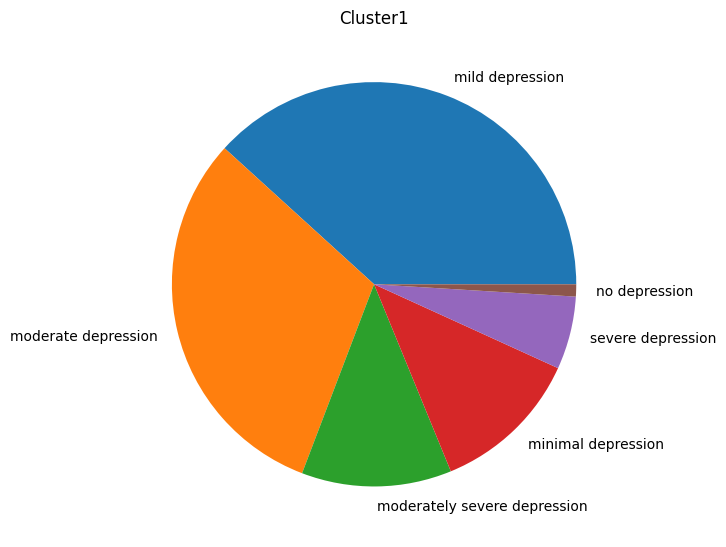

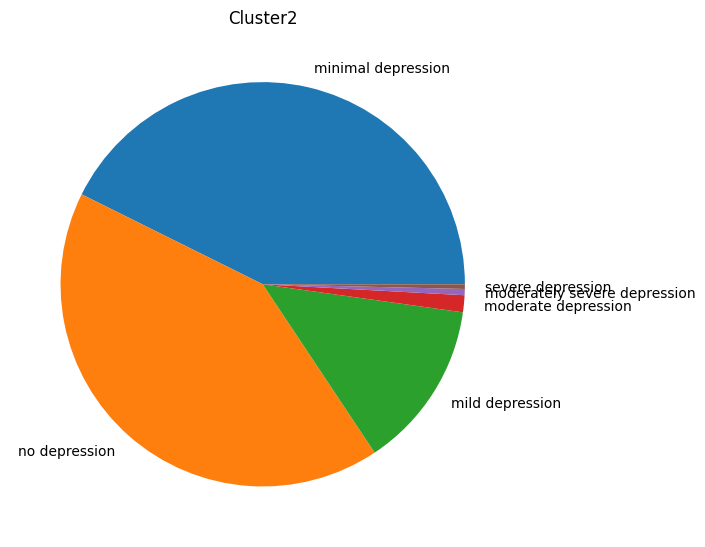

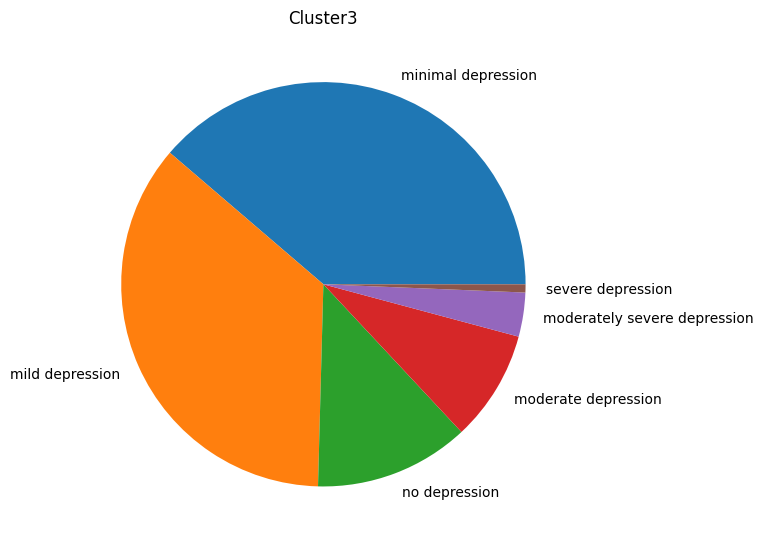

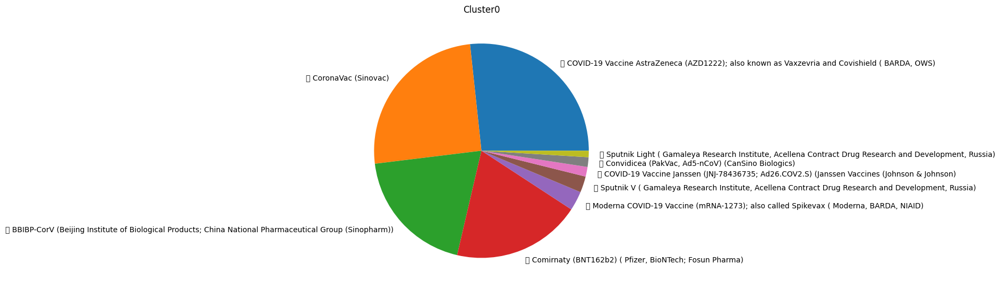

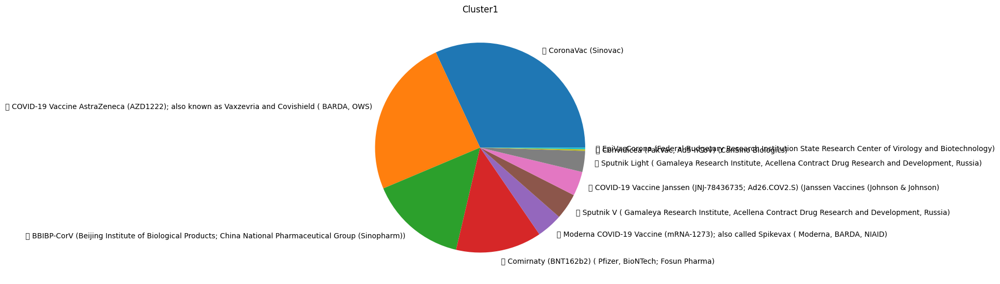

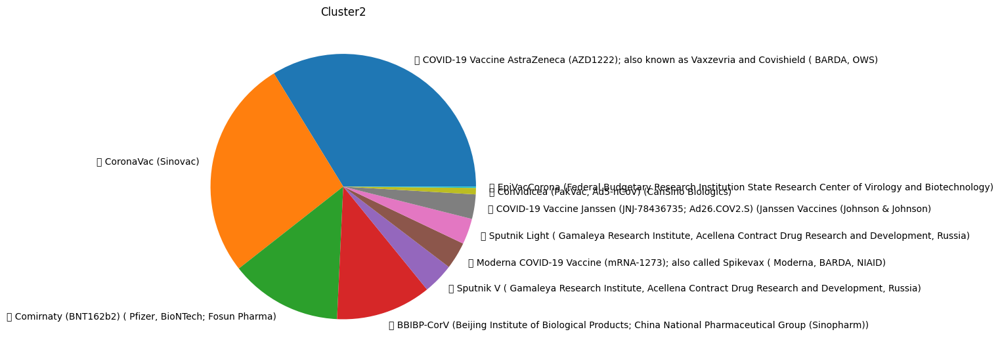

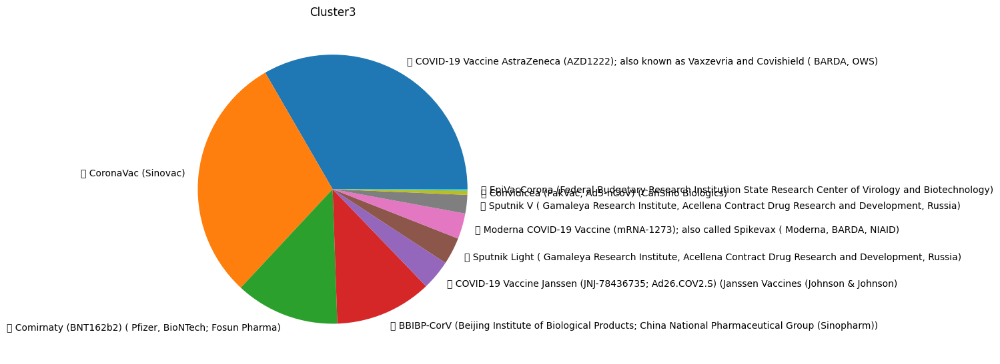

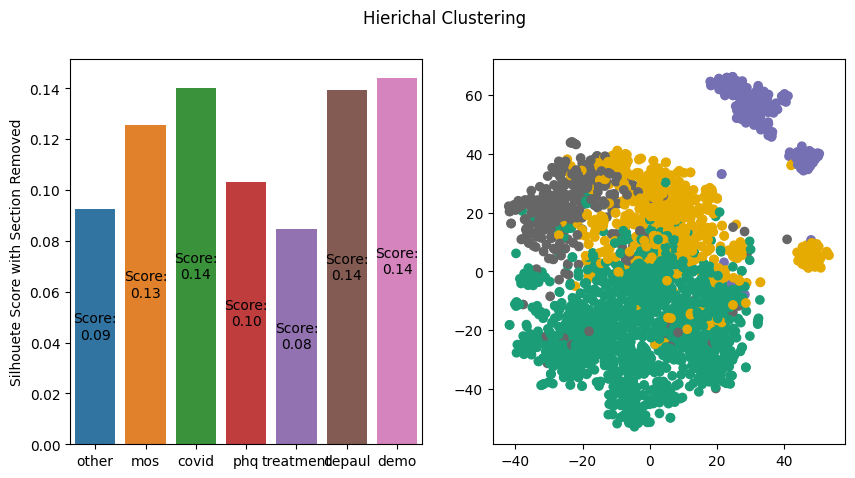

Avg score 0.11846403048298663


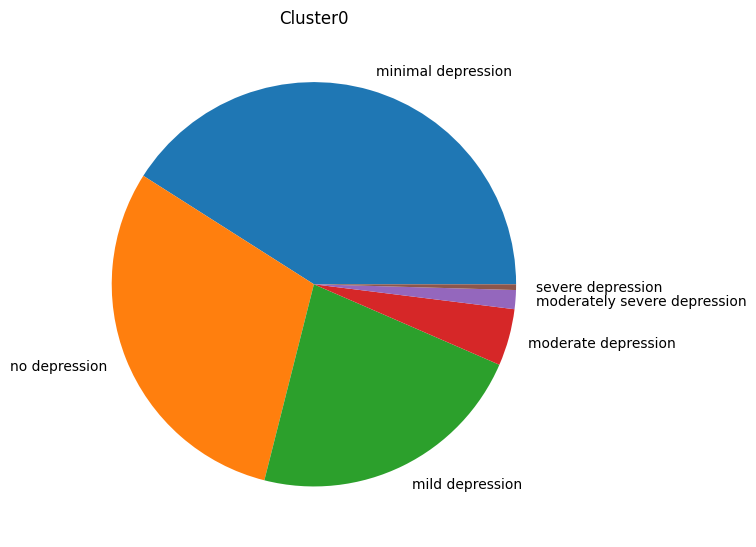

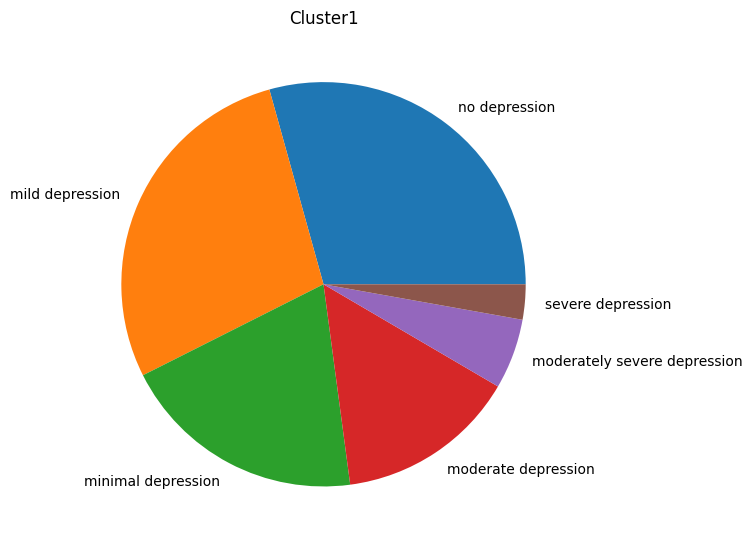

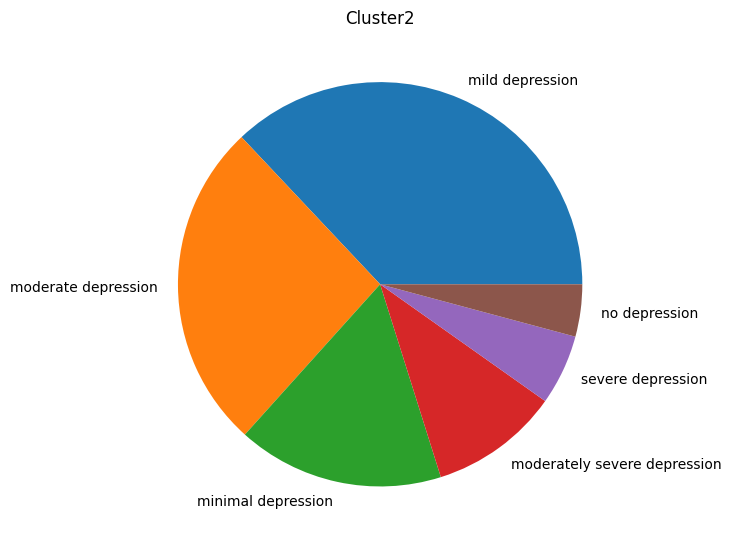

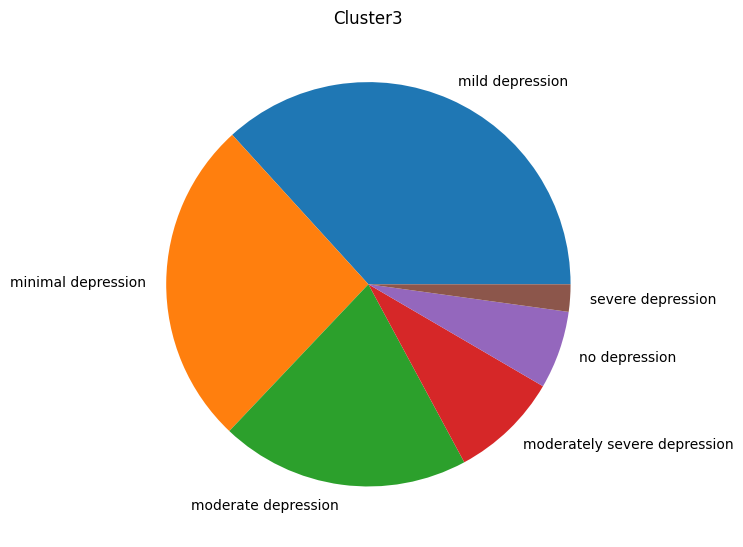

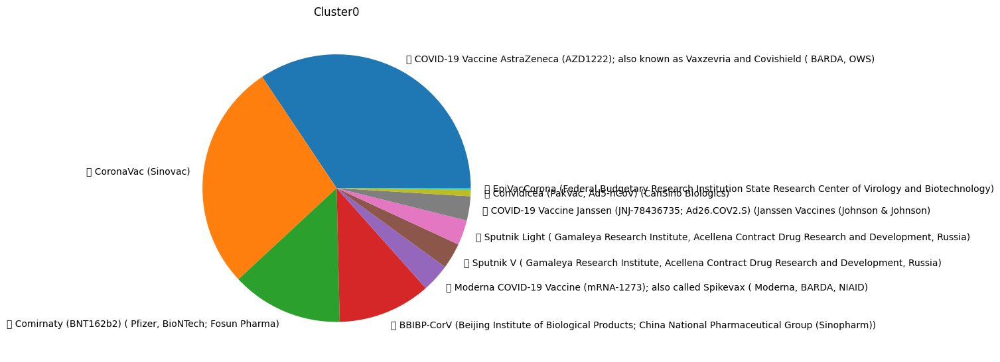

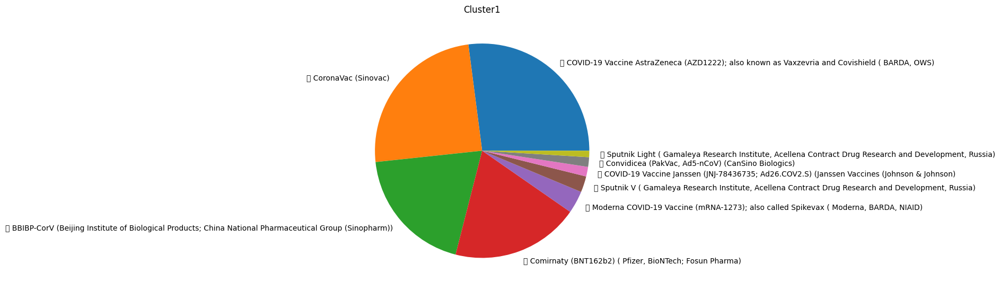

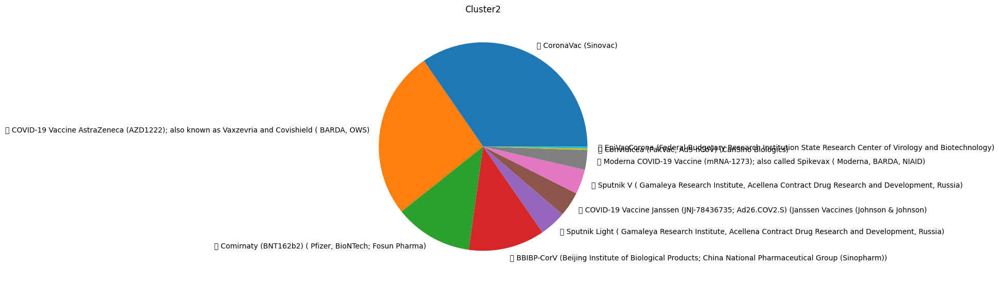

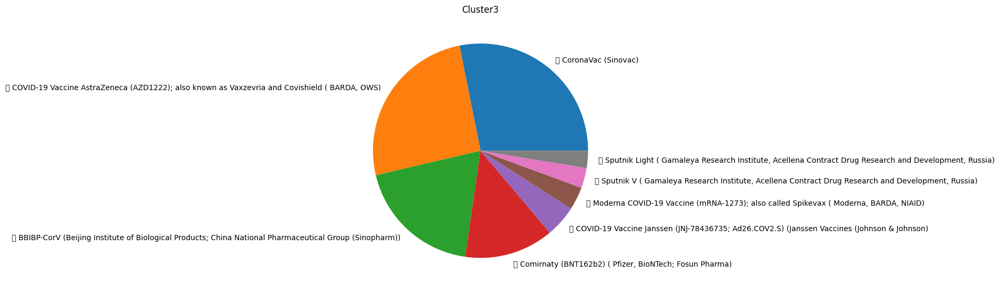

In [15]:
## try with 4 clusters 
models={"kmeans":k_means_sklearn(n_clusters=4),"Birch":Birch(n_clusters=4),
        "Gaussian Mixture":GaussianMixture(n_components=4),
        "Hierichal Clustering":AgglomerativeClustering(n_clusters=4)}
for name,model in models.items():
    results={}
    for section,array in section_removed_arrays.items():
        model = model
        try:
            labels=model.fit_predict(array)
        except:
            model.fit(array)
            labels=model.predict(array)
        sil_score=silhouette_score(array,labels)
        results[section]=sil_score
    fig, (ax,ax2) = plt.subplots(figsize=(10,5),ncols=2)
    sns.barplot(x=list(results.keys()), y=list(results.values()), capsize=0.2, ax=ax)
    ax.bar_label(ax.containers[-1], fmt='Score:\n%.2f', label_type='center')
    ax.set_title("")
    ax.set(ylabel='Silhouete Score with Section Removed')
    data,data_orginal=read_data(remove_incremental=False)
    data_orginal=prep_comparision(labels)
    tsne_3_2(x_compressed,data_orginal,ax=ax2,which="2d_only")
    plt.suptitle(name)
    plt.show()
    print(f"Avg score {np.mean(list(results.values()))}")
    #count_dummy_per_cluster("other",4,type="cloud")
    pie_cluster("phq_score",n=4)
    pie_cluster("Type of the vaccine_treatment",n=4)
    

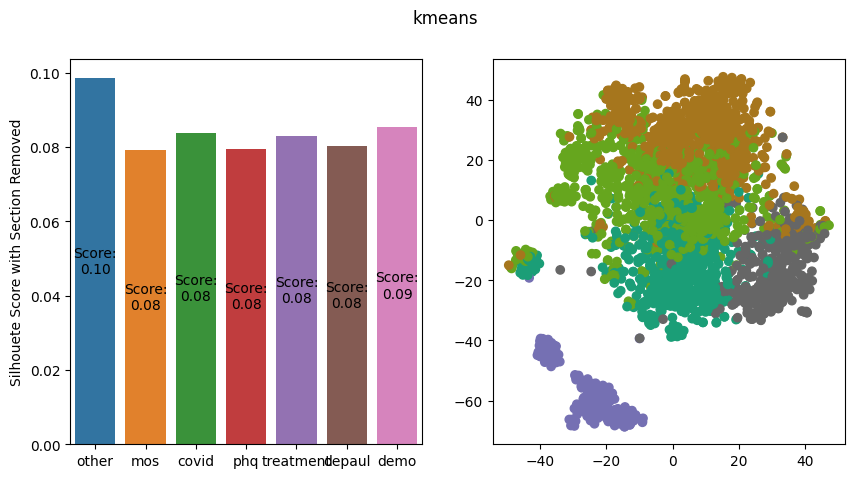

Avg score 0.08432291006310674


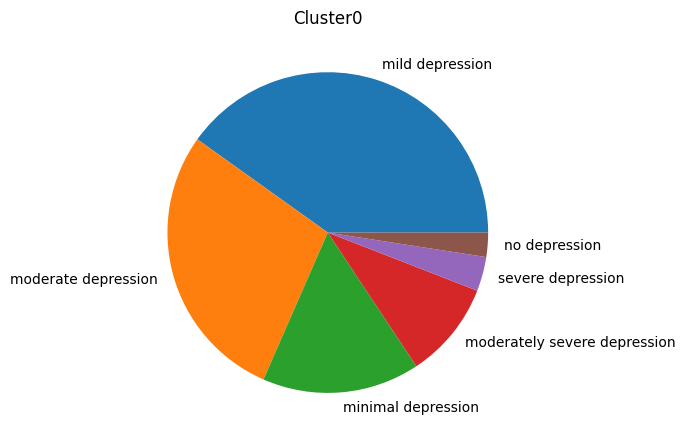

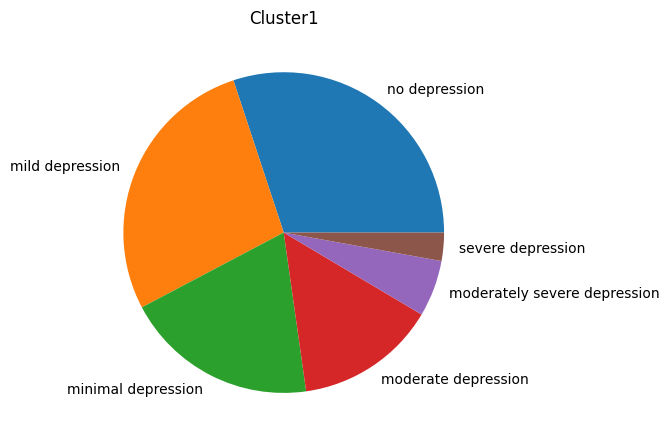

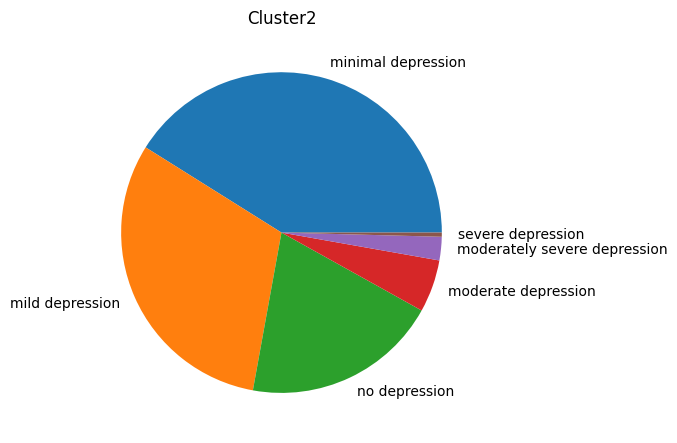

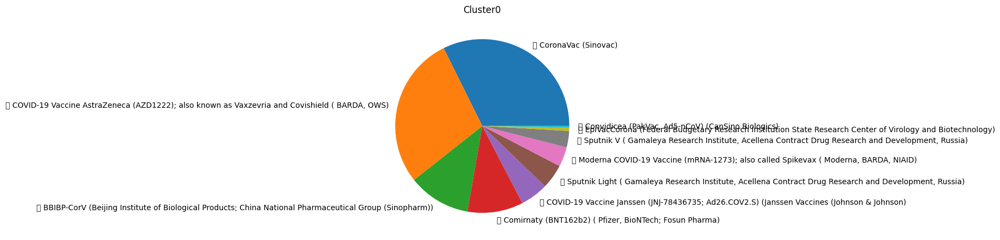

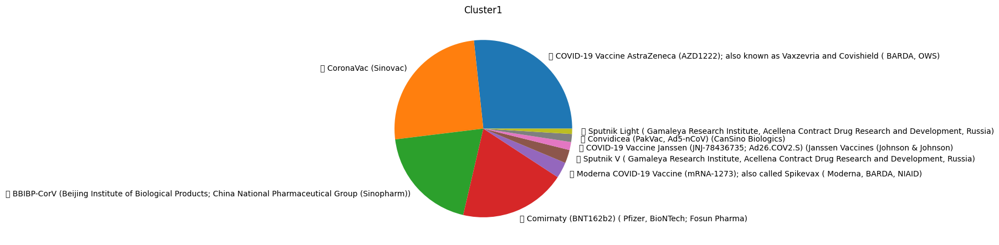

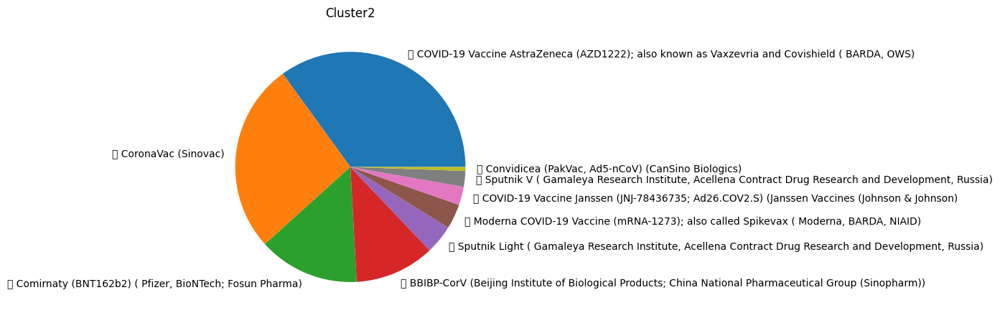

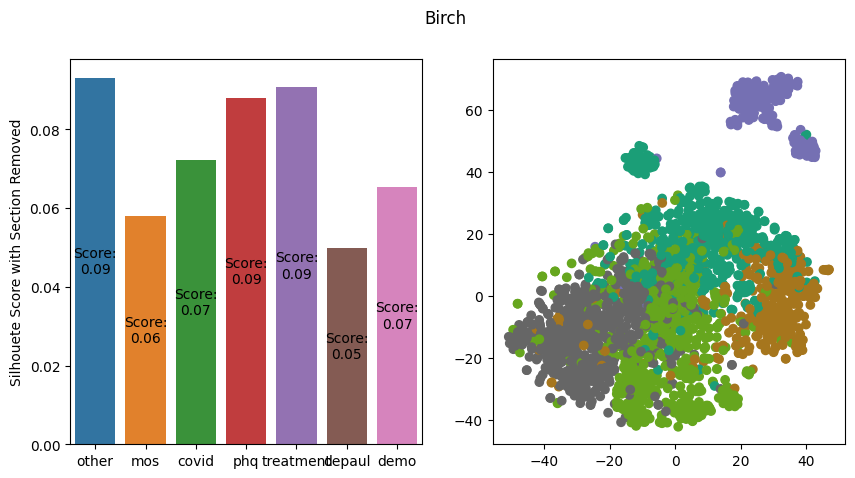

Avg score 0.07387497526492733


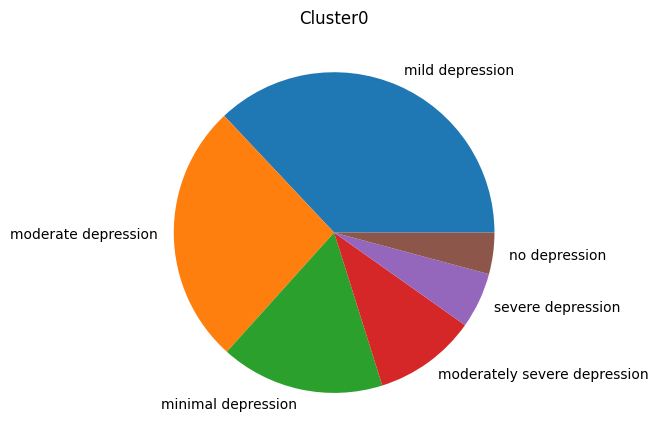

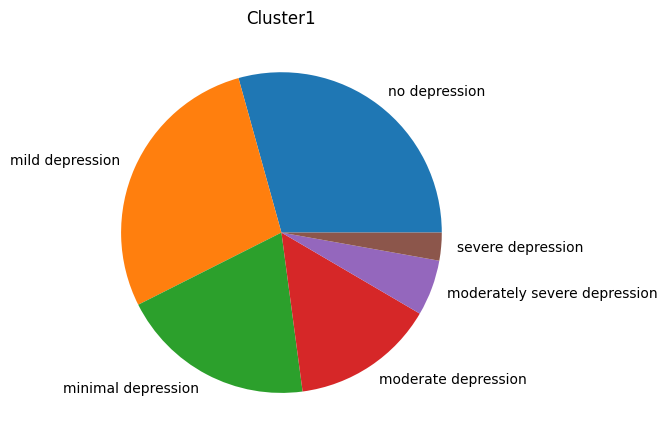

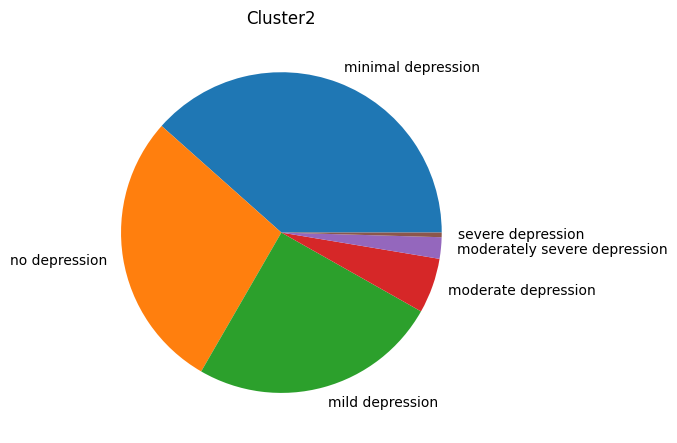

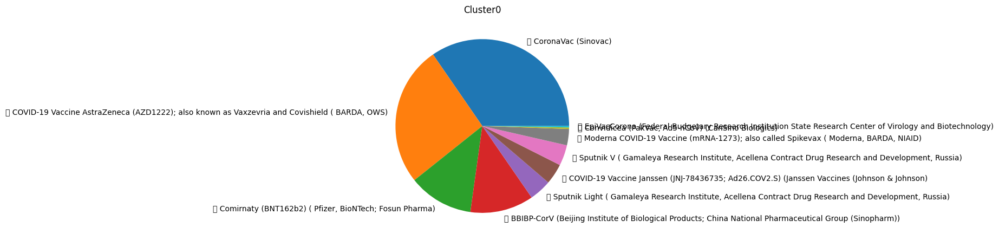

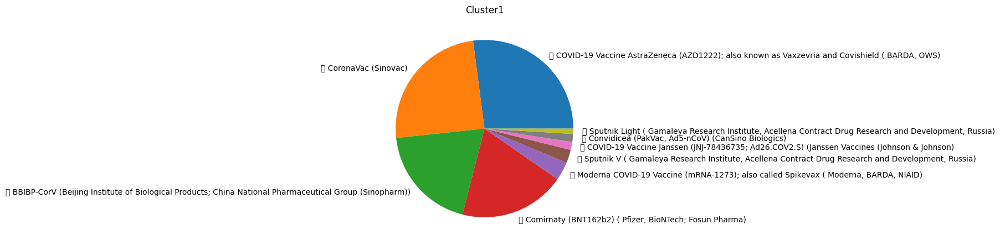

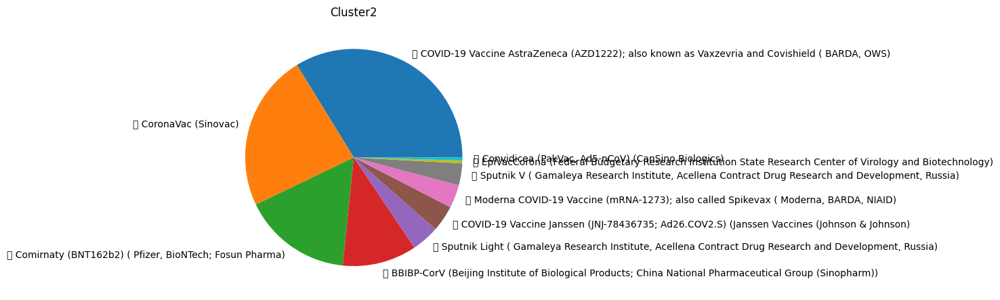

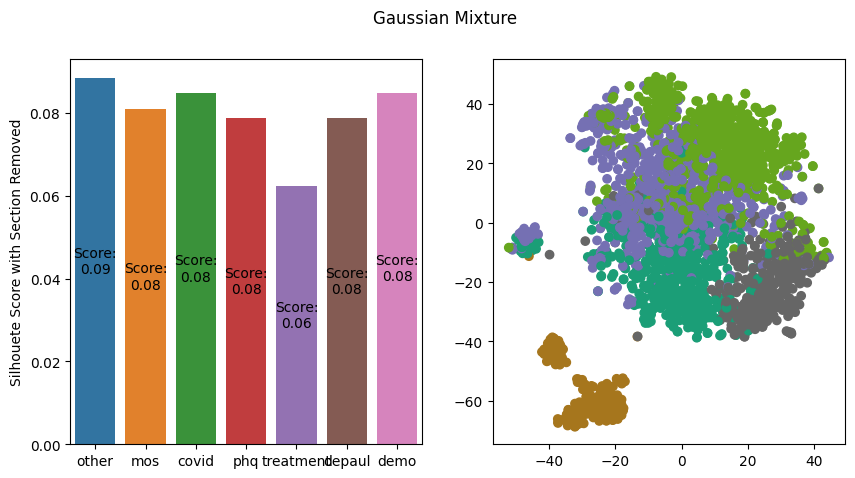

Avg score 0.07978606656741147


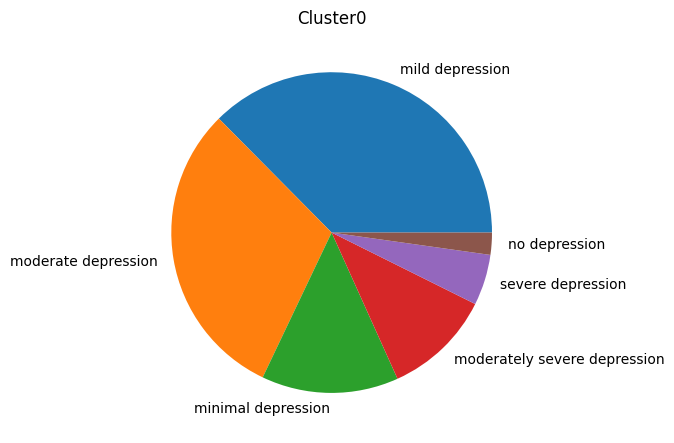

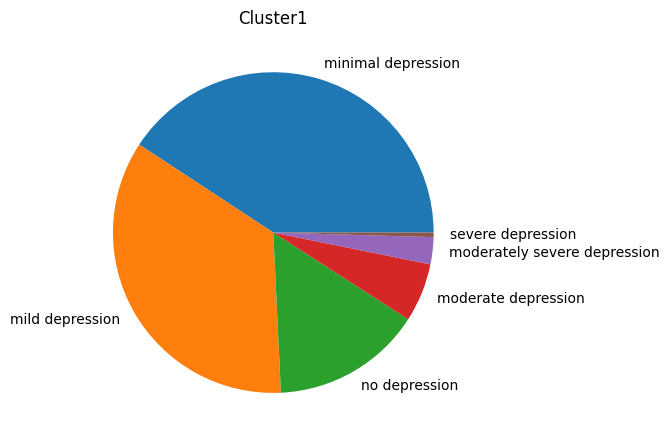

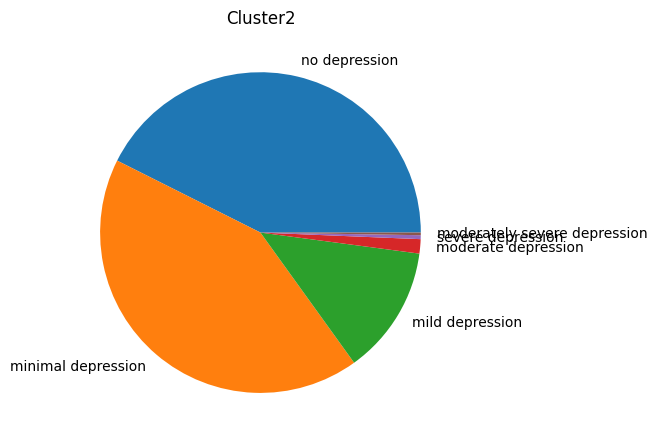

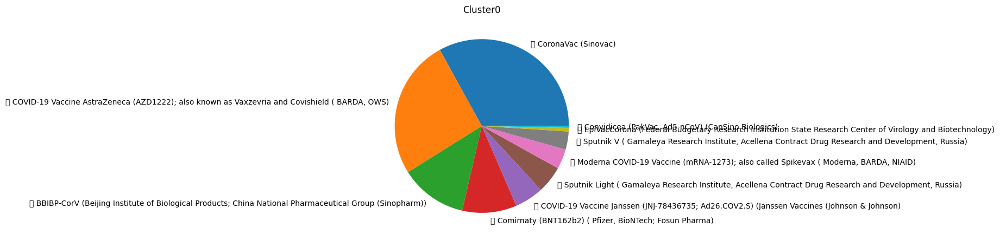

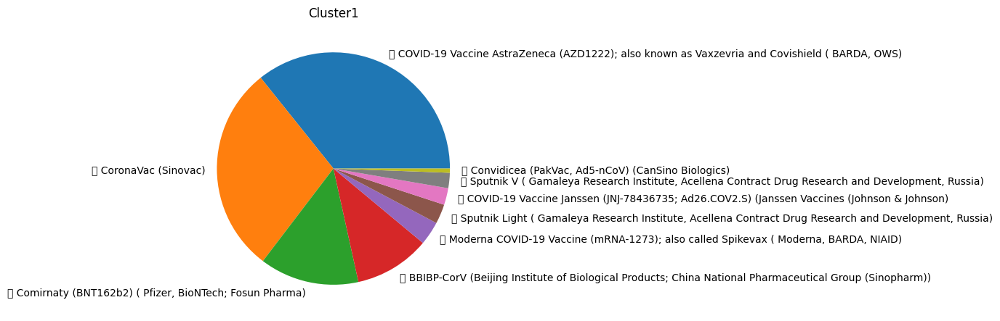

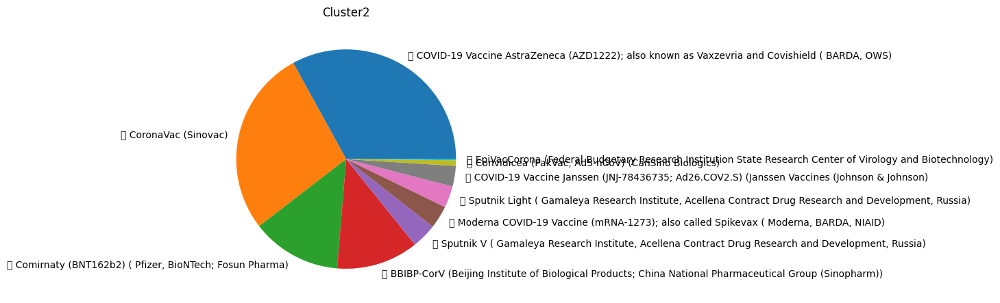

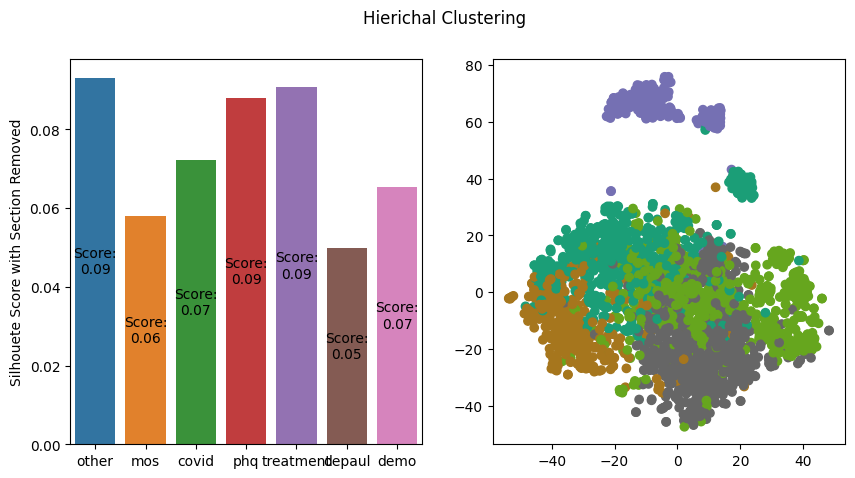

Avg score 0.07387497526492733


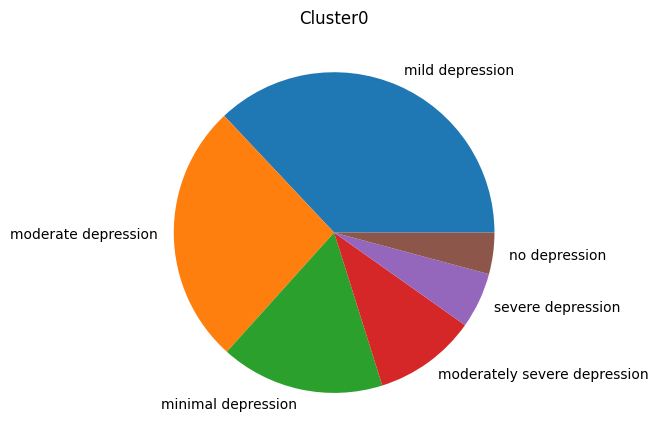

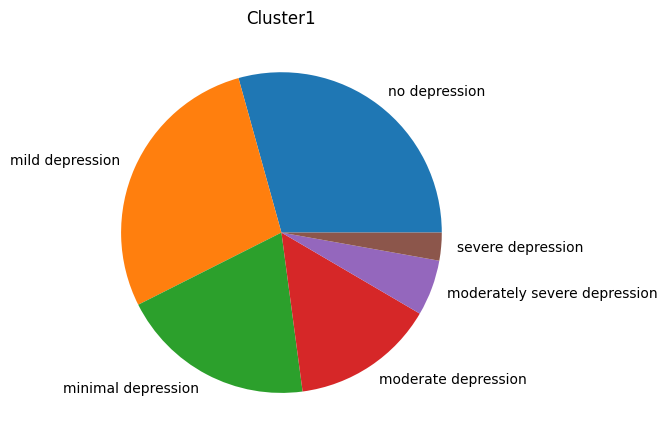

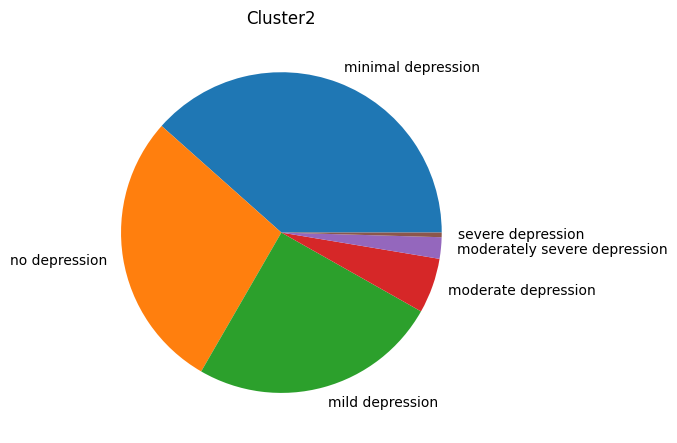

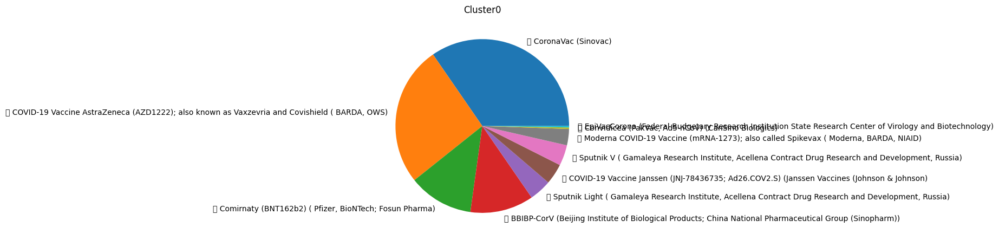

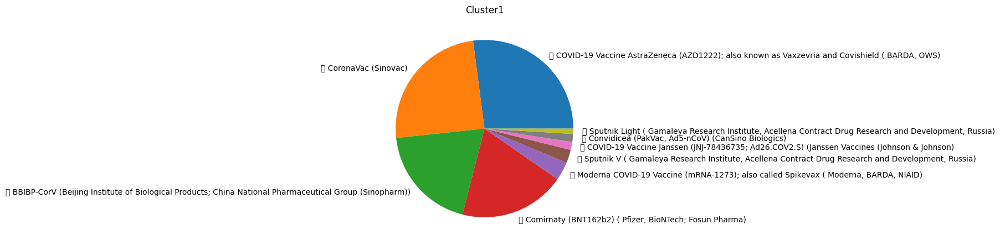

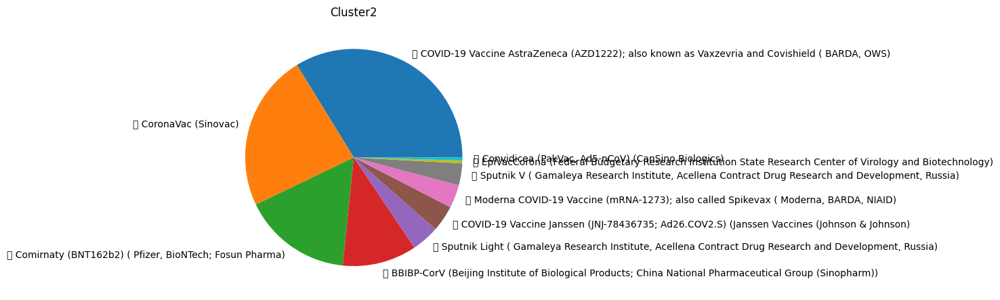

In [16]:
models={"kmeans":k_means_sklearn(n_clusters=5),"Birch":Birch(n_clusters=5),
        "Gaussian Mixture":GaussianMixture(n_components=5),
        "Hierichal Clustering":AgglomerativeClustering(n_clusters=5)}
for name,model in models.items():
    results={}
    for section,array in section_removed_arrays.items():
        model = model
        try:
            labels=model.fit_predict(array)
        except:
            model.fit(array)
            labels=model.predict(array)
        sil_score=silhouette_score(array,labels)
        results[section]=sil_score
    fig, (ax,ax2) = plt.subplots(figsize=(10,5),ncols=2)
    sns.barplot(x=list(results.keys()), y=list(results.values()), capsize=0.2, ax=ax)
    ax.bar_label(ax.containers[-1], fmt='Score:\n%.2f', label_type='center')
    ax.set_title("")
    ax.set(ylabel='Silhouete Score with Section Removed')
    data,data_orginal=read_data(remove_incremental=True)
    data_orginal=prep_comparision(labels)
    tsne_3_2(x_compressed,data_orginal,ax=ax2,which="2d_only")
    plt.suptitle(name)
    plt.show()
    print(f"Avg score {np.mean(list(results.values()))}")
    #count_dummy_per_cluster("other",5,type="cloud")
    pie_cluster("phq_score",n=5)
    pie_cluster("Type of the vaccine_treatment",n=5)

## HDBSCAN

In [17]:
import hdbscan

In [41]:
model=hdbscan.HDBSCAN(min_cluster_size=5,gen_min_span_tree=True)
X=section_removed_arrays["demo"]
model.fit(X)
set(model.labels_)

{-1, 0, 1, 2}

-1 is noise , this is not an actual cluster 

<AxesSubplot: >

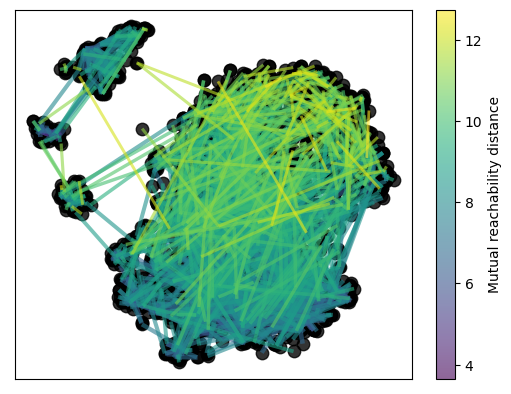

In [42]:
model.minimum_spanning_tree_.plot(edge_cmap='viridis',
                                      edge_alpha=0.6,
                                      node_size=80,
                                      edge_linewidth=2)

<AxesSubplot:ylabel='$\\lambda$ value'>

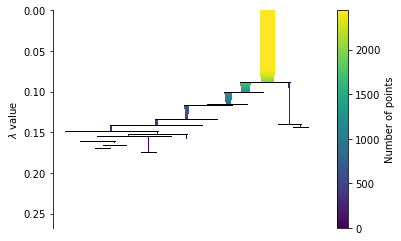

In [15]:
model.condensed_tree_.plot()


Percent of data retained: 0.8775092175337976
Total Clusters found: 3
Cluster splits: [6, 1902, 234]


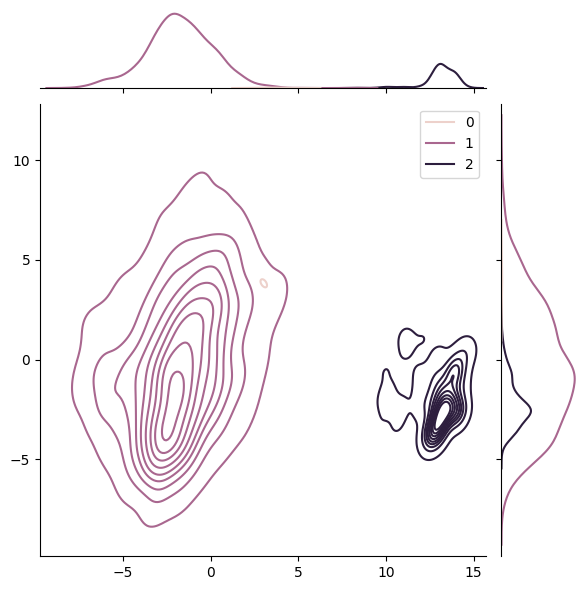

In [43]:
# evalute the clusters
labels = model.labels_
clustered = (labels >= 0)
    
coverage = np.sum(clustered) / X.shape[0]
total_clusters = np.max(labels) + 1
cluster_sizes = np.bincount(labels[clustered]).tolist()

print(f"Percent of data retained: {coverage}")
print(f"Total Clusters found: {total_clusters}")
print(f"Cluster splits: {cluster_sizes}")


_=sns.jointplot(
    x=X[clustered, 0], y=X[clustered, 1], hue=labels[clustered], kind="kde"
)

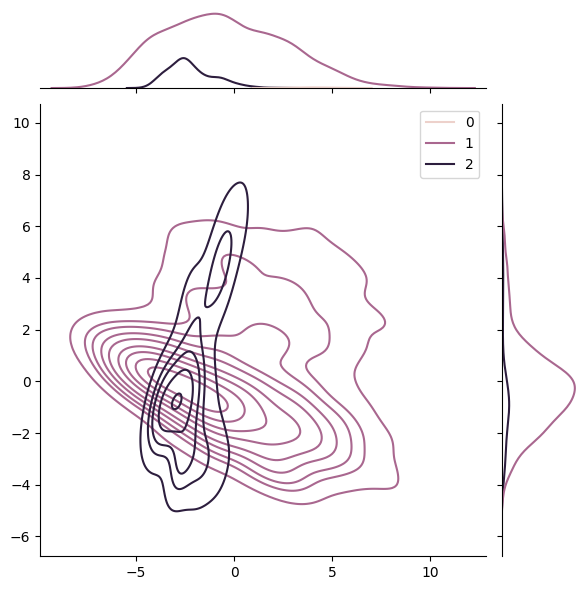

In [46]:
_=sns.jointplot(
    x=X[clustered, 1], y=X[clustered, 2], hue=labels[clustered], kind="kde"
)

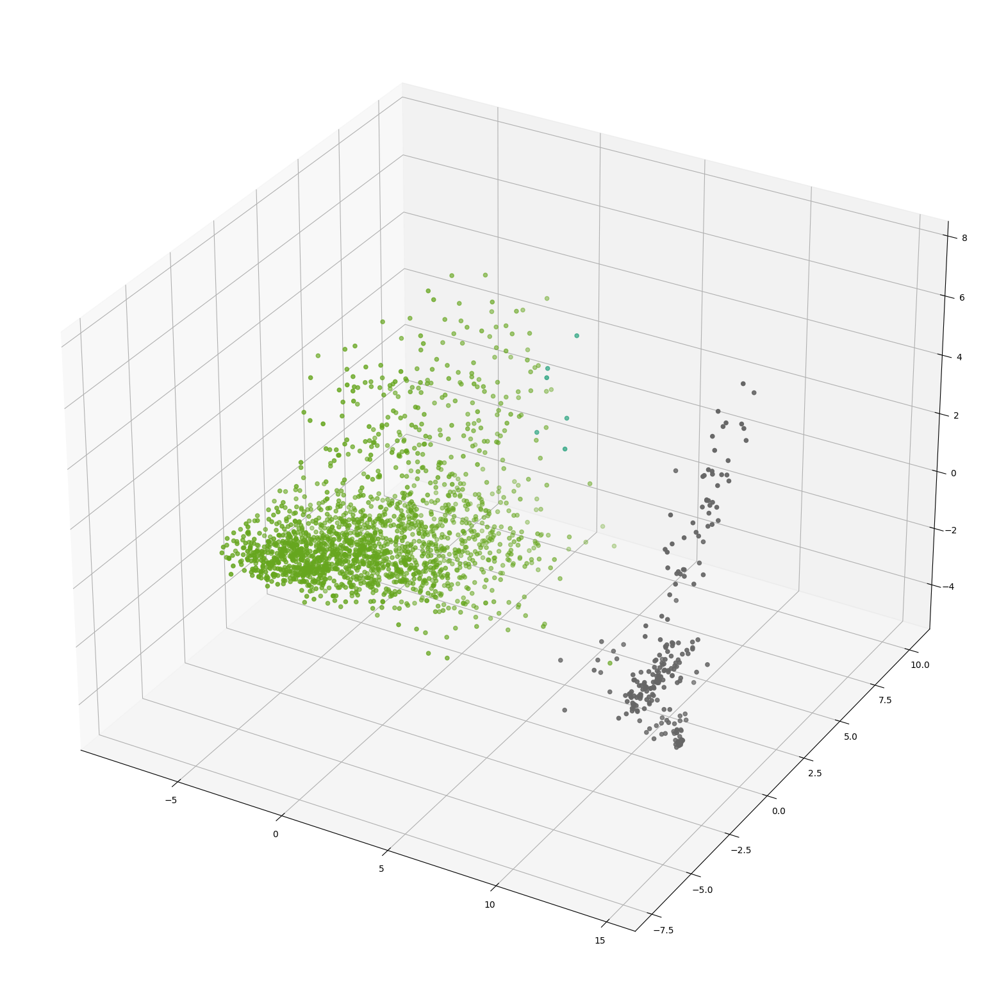

In [47]:
%matplotlib inline
fig = plt.figure(figsize=(30,20))
ax = fig.add_subplot(111, projection = '3d')
ax.scatter(X[clustered, 0],X[clustered, 1],X[clustered,2],c=labels[clustered],cmap=cm.Dark2)

In [48]:
f"{model.relative_validity_:.5f}"

'0.00173'

In [49]:
silhouette_score(data,model.labels_)

0.18264775861188726

In [50]:
set(clustered)

{False, True}

In [51]:
labels

array([ 1,  1,  1, ..., -1,  1,  1])

In [52]:
clustered=np.where(clustered,1,0)
data,data_orginal=read_data(remove_incremental=True)
data_orginal=prep_comparision(labels)
data_orginal.cluster.value_counts()

 1    1902
-1     299
 2     234
 0       6
Name: cluster, dtype: int64

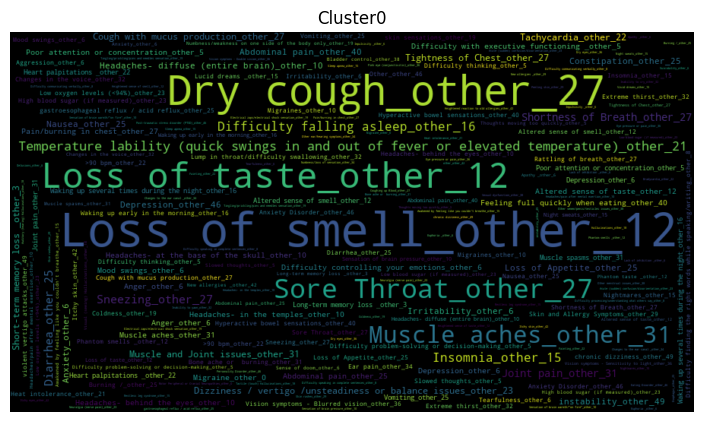

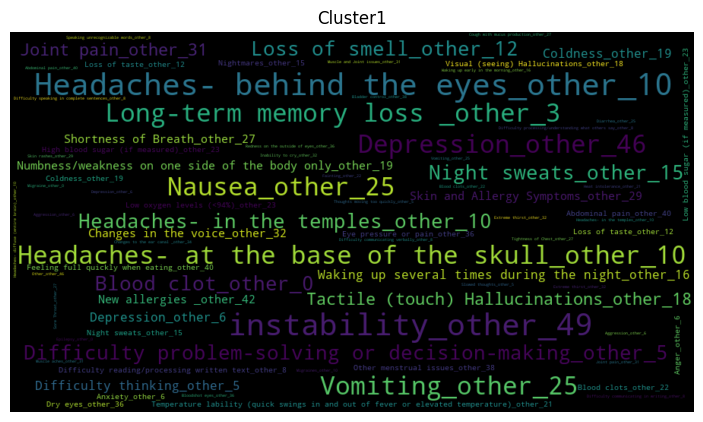

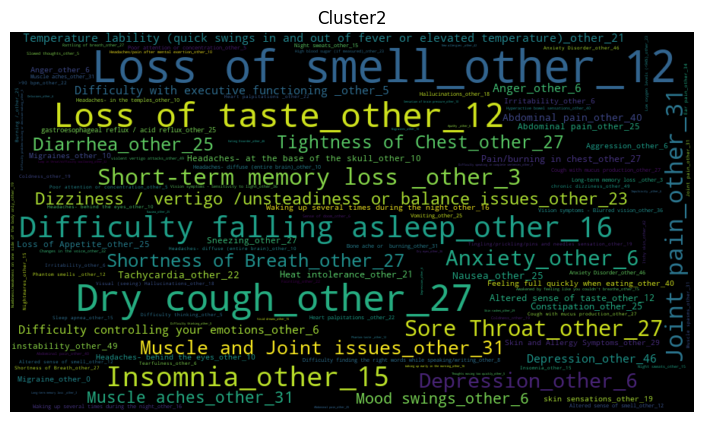

In [53]:
cluster0=data_orginal[data_orginal.cluster==0]
cluster1=data_orginal[data_orginal.cluster==1]
cluster2=data_orginal[data_orginal.cluster==2]
clusters=[cluster1,cluster0,cluster2]
cols=[x for x in data_orginal.columns if "other" in x]
dummy_cols=[]
for col in cols:
    if data_orginal[col].nunique()<=2 and pd.api.types.is_numeric_dtype(data_orginal[col]):
        dummy_cols.append(col)
for e,cluster in enumerate(clusters):
    plt.figure(figsize=(30,10))
    ax=plt.subplot(1,3,e+1)
    summs={}
    for col in dummy_cols:
        if "None of" in col or "do not" in col or "don't have" in col or "no" in col.lower():
            pass
        else:
            try:
                col_name=col.replace(section,"")
                summs[col_name]=np.sum(cluster[col])/len(cluster)
                summs={k: v for k, v in sorted(summs.items(), key=lambda item: item[1],reverse=True)}
            except:
                pass
    wordcloud = WordCloud(width=900,height=500, max_words=1628,relative_scaling=1,normalize_plurals=False).generate_from_frequencies(summs)
    ax.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    ax.set_title(f"Cluster{e}")
    plt.show()
            

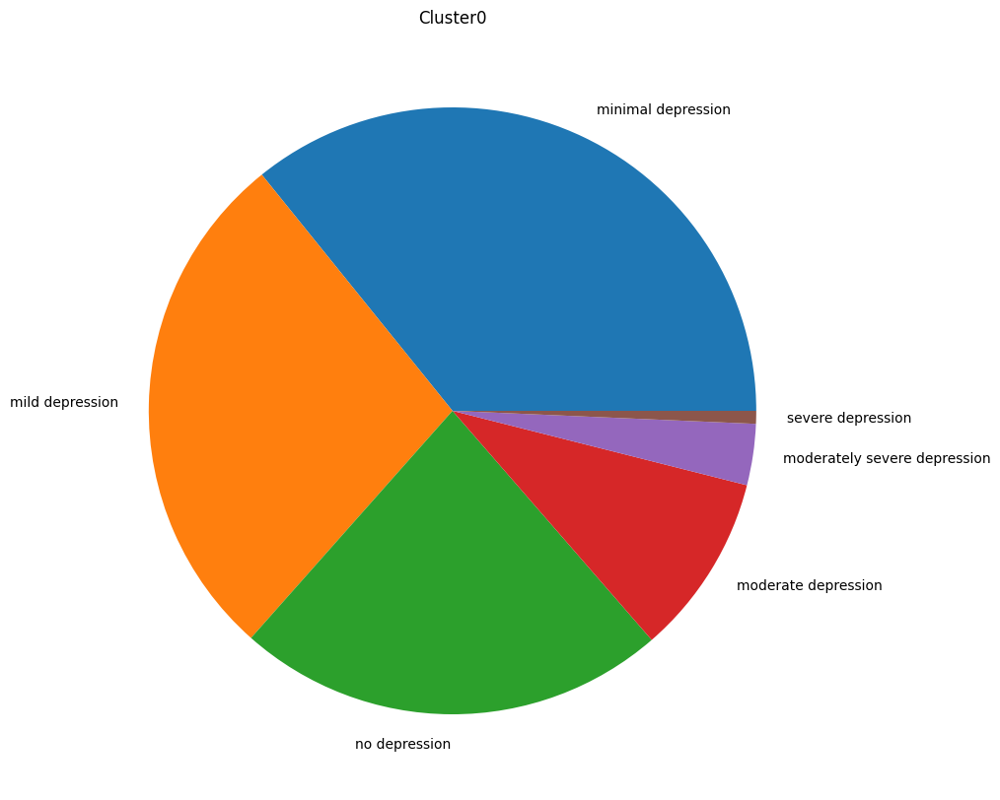

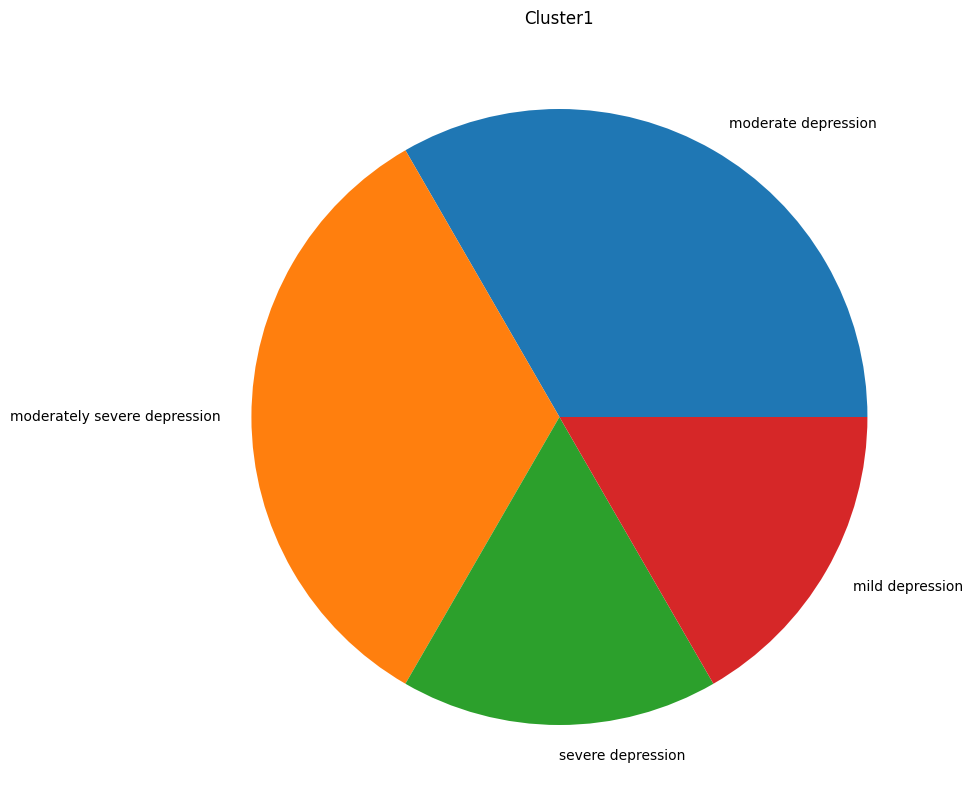

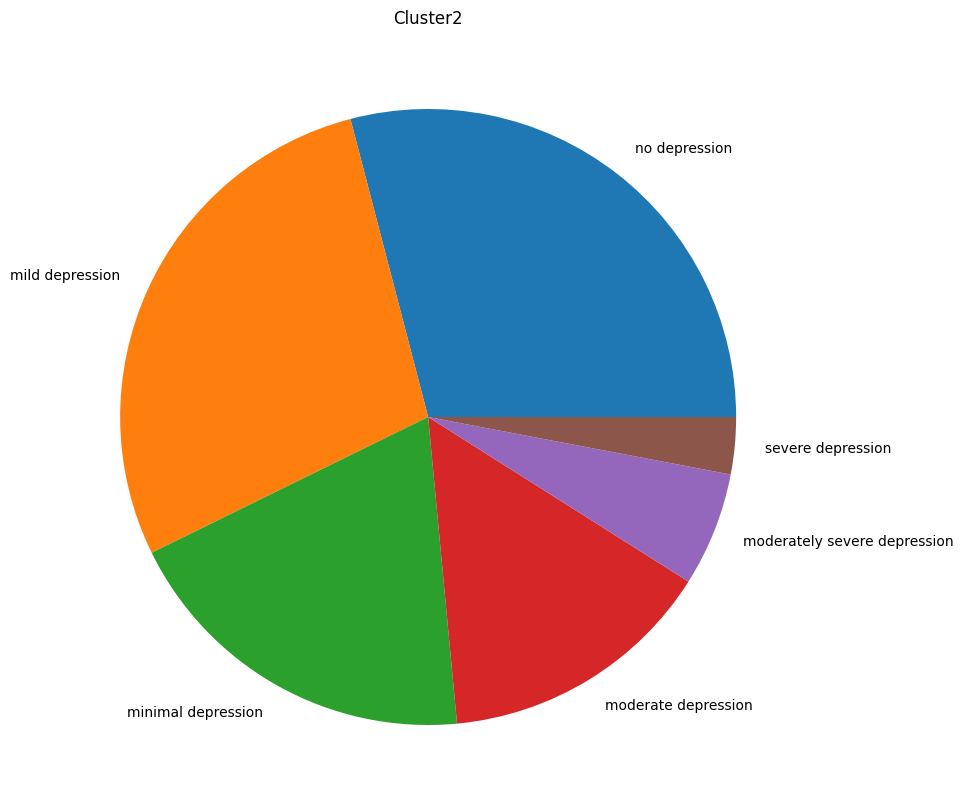

In [54]:
for e,cluster in enumerate(clusters):
    plt.figure(figsize=(30,10))
    keys=list(cluster["phq_score"].value_counts().keys())
    values=list(cluster["phq_score"].value_counts().values)
    plt.pie(values,labels=keys)
    plt.title(f"Cluster{e}")
    plt.show()

In [28]:
## try removing two sections from data :treatment and demo and hospitlisation
data,data_orginal=read_data()
print(data.shape)
for section in ["demo","treatment"]:
    cols=[x for x in data_orginal.columns if section in x]
    for col in cols:
        vs=[]
        if pd.api.types.is_object_dtype(data_orginal[col]):
            try:
                vs=list(data_orginal[col].unique())
                vs.remove(np.nan)
                data.drop(vs,axis=1,inplace=True)
            except:
                pass
        elif pd.api.types.is_numeric_dtype(data_orginal[col]):
            if col in data.columns:
                data.drop(col,axis=1,inplace=True)
            ##remove dummies
        col_dummies=[x for x in data.columns if f"_{section}" in x]
        data.drop(col_dummies,axis=1,inplace=True)
    print(data.shape)

X=np.array(data)
x_compressed=preferred_dimensions(X)
print(x_compressed.shape)

(2441, 947)
(2441, 871)
(2441, 820)
(2441, 190)


Percent of data retained: 0.8914379352724293
Total Clusters found: 3
Cluster splits: [6, 1936, 234]


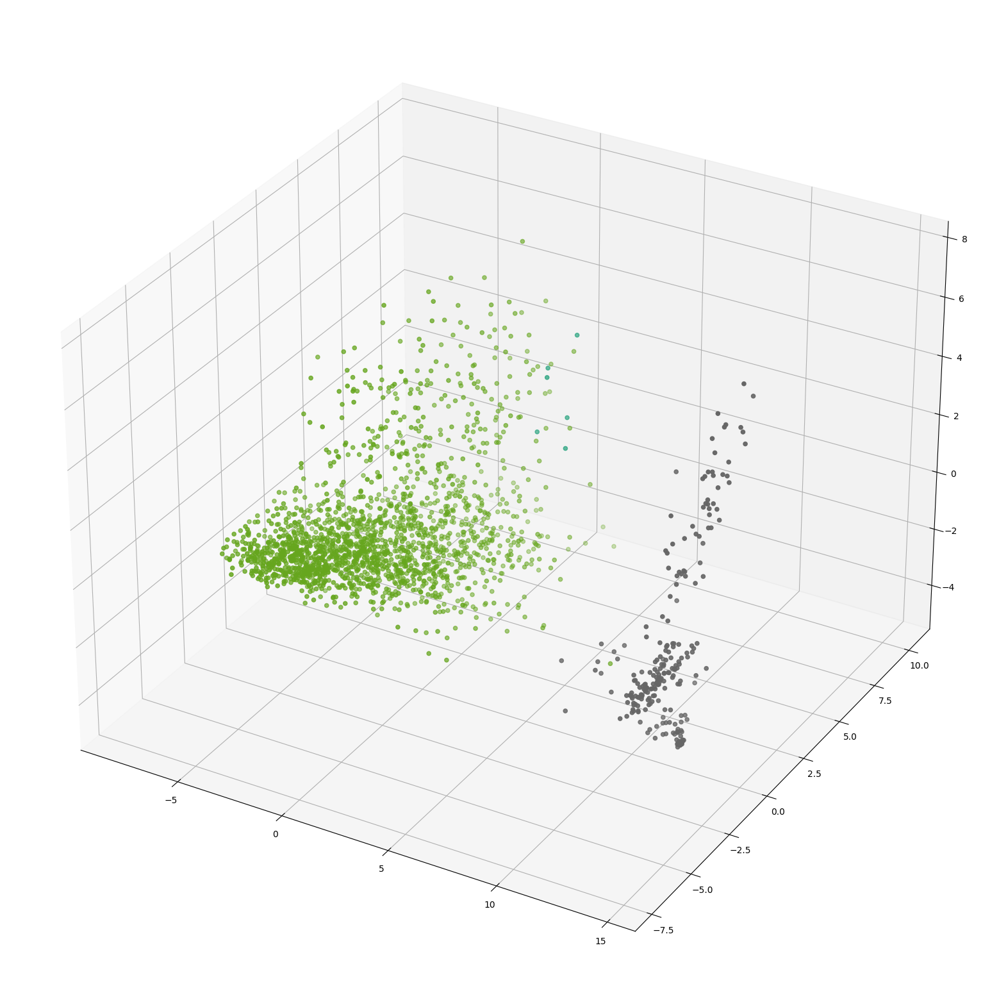

In [55]:
##build a model again with full data instead of compressed 
model=hdbscan.HDBSCAN(min_cluster_size=5,gen_min_span_tree=True)
model.fit(x_compressed)
labels = model.labels_
clustered = (labels >= 0)
    
coverage = np.sum(clustered) / x_compressed.shape[0]
total_clusters = np.max(labels) + 1
cluster_sizes = np.bincount(labels[clustered]).tolist()

print(f"Percent of data retained: {coverage}")
print(f"Total Clusters found: {total_clusters}")
print(f"Cluster splits: {cluster_sizes}")

%matplotlib inline
fig = plt.figure(figsize=(30,20))
ax = fig.add_subplot(111, projection = '3d')
ax.scatter(x_compressed[clustered, 0],x_compressed[clustered, 1],x_compressed[clustered,2],c=labels[clustered],cmap=cm.Dark2)



In [56]:
model.relative_validity_

0.003535081956265756

In [57]:
silhouette_score(x_compressed,model.labels_)

0.20080513998191557

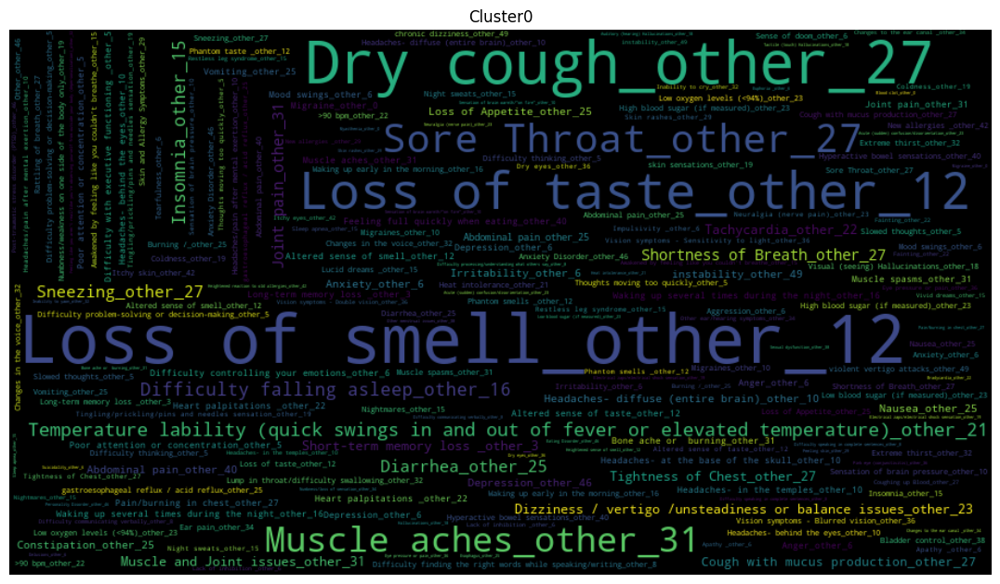

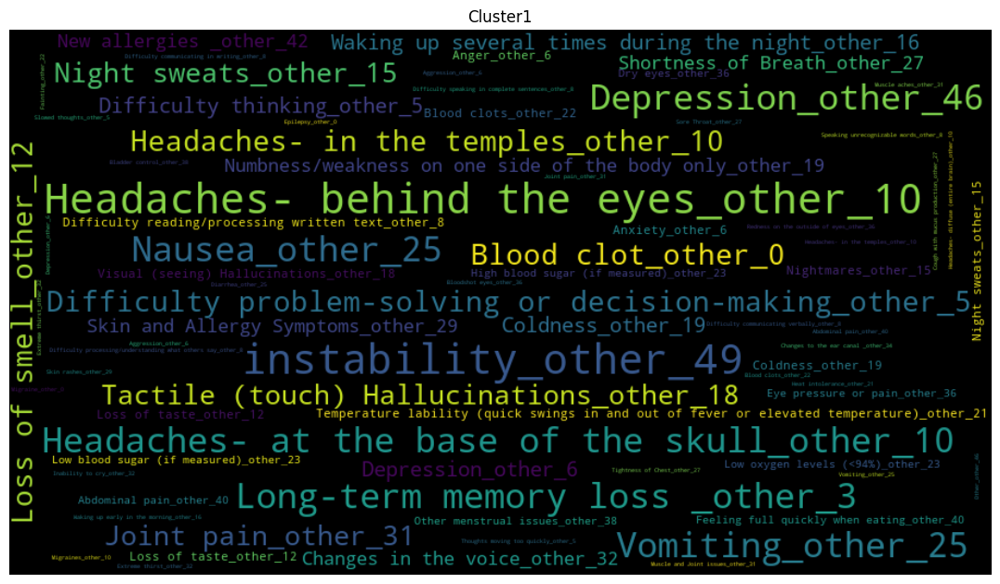

In [58]:
clustered=np.where(clustered,1,0)
data,data_orginal=read_data(remove_incremental=True)
data_orginal=prep_comparision(labels)
data_orginal.cluster.value_counts()
cluster0=data_orginal[data_orginal.cluster==0]
cluster1=data_orginal[data_orginal.cluster==1]
clusters=[cluster1,cluster0]
cols=[x for x in data_orginal.columns if "other" in x]
dummy_cols=[]
for col in cols:
    if data_orginal[col].nunique()<=2 and pd.api.types.is_numeric_dtype(data_orginal[col]):
        dummy_cols.append(col)
for e,cluster in enumerate(clusters):
    plt.figure(figsize=(30,10))
    ax=plt.subplot(1,2,e+1)
    summs={}
    for col in dummy_cols:
        if "None of" in col or "do not" in col or "don't have" in col or "no" in col.lower():
            pass
        else:
            try:
                col_name=col.replace(section,"")
                summs[col_name]=np.sum(cluster[col])/len(cluster)
                summs={k: v for k, v in sorted(summs.items(), key=lambda item: item[1],reverse=True)}
            except:
                pass
    wordcloud = WordCloud(width=900,height=500, max_words=1628,relative_scaling=1,normalize_plurals=False).generate_from_frequencies(summs)
    ax.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    ax.set_title(f"Cluster{e}")
    plt.show()

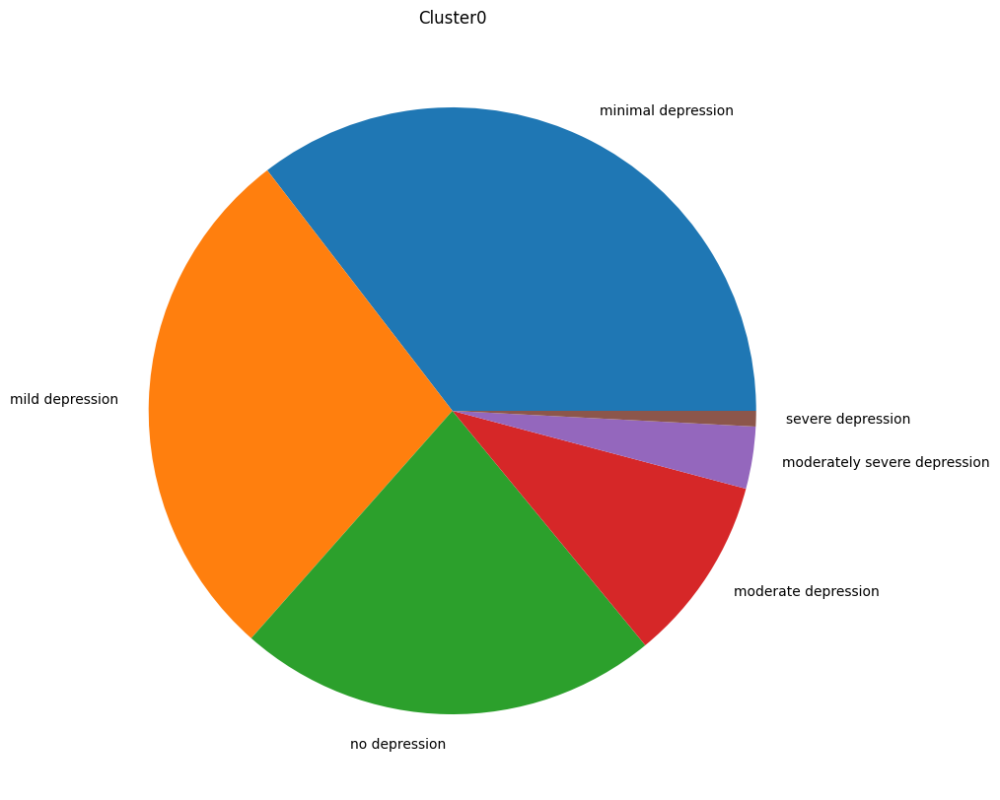

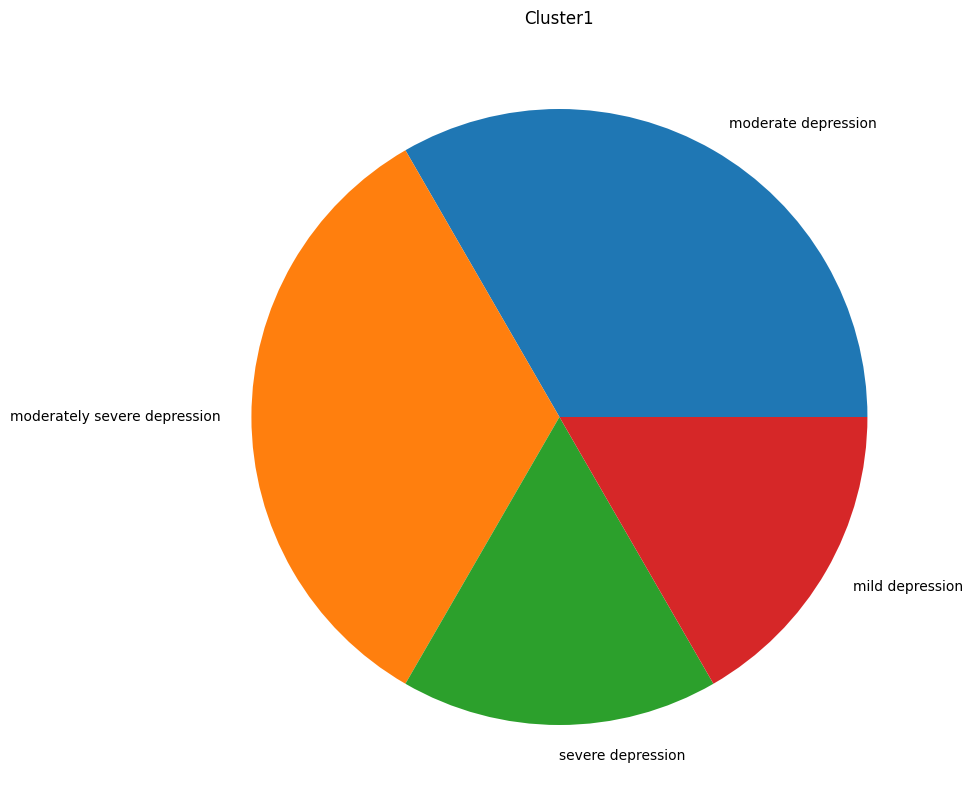

In [59]:
for e,cluster in enumerate(clusters):
    plt.figure(figsize=(30,10))
    keys=list(cluster["phq_score"].value_counts().keys())
    values=list(cluster["phq_score"].value_counts().values)
    plt.pie(values,labels=keys)
    plt.title(f"Cluster{e}")
    plt.show()

In [74]:
len(clustered),len(labels)

(2441, 2441)

In [75]:
labels_model["hdbscan"]=labels

In [76]:
data,data_orginal=read_data(remove_incremental=False)

In [77]:
for n,v in labels_model.items():
    data_orginal[n]=v

In [78]:
data_orginal.columns[-5:]

Index(['kmeans', 'Birch', 'Gaussian Mixture', 'Hierichal Clustering',
       'hdbscan'],
      dtype='object')

In [79]:
data_orginal.to_csv("cleaned_clusterd.csv")

In [38]:
##GridSearch
from sklearn.model_selection import GridSearchCV
import hdbscan
from sklearn.metrics import make_scorer


hdb = hdbscan.HDBSCAN(gen_min_span_tree=True).fit(X)

# specify parameters and distributions to sample from
param_dist = {'min_samples': [10,30,50,60,100,1000,300],
              'min_cluster_size':[100,200,300,400,500,600,1000,None],  
              'cluster_selection_method' : ['eom','leaf'],
              'metric' : ['euclidean','manhattan'] 
             }

#validity_scroer = "hdbscan__hdbscan___HDBSCAN__validity_index"
validity_scorer = make_scorer(hdbscan.validity.validity_index,greater_is_better=True)


grid_search = GridSearchCV(hdb,param_grid=param_dist
                                   ,scoring=validity_scorer 
                                   ,verbose=100,cv=3)

grid_search.fit(X)


print(f"Best Parameters {grid_search.best_params_}")
print(f"DBCV score :{grid_search.best_estimator_.relative_validity_}")


Fitting 3 folds for each of 224 candidates, totalling 672 fits
[CV 1/3; 1/224] START cluster_selection_method=eom, metric=euclidean, min_cluster_size=100, min_samples=10
[CV 1/3; 1/224] END cluster_selection_method=eom, metric=euclidean, min_cluster_size=100, min_samples=10;, score=nan total time=   3.8s
[CV 2/3; 1/224] START cluster_selection_method=eom, metric=euclidean, min_cluster_size=100, min_samples=10
[CV 2/3; 1/224] END cluster_selection_method=eom, metric=euclidean, min_cluster_size=100, min_samples=10;, score=nan total time=   3.4s
[CV 3/3; 1/224] START cluster_selection_method=eom, metric=euclidean, min_cluster_size=100, min_samples=10
[CV 3/3; 1/224] END cluster_selection_method=eom, metric=euclidean, min_cluster_size=100, min_samples=10;, score=nan total time=   3.6s
[CV 1/3; 2/224] START cluster_selection_method=eom, metric=euclidean, min_cluster_size=100, min_samples=30
[CV 1/3; 2/224] END cluster_selection_method=eom, metric=euclidean, min_cluster_size=100, min_samples

[CV 1/3; 12/224] END cluster_selection_method=eom, metric=euclidean, min_cluster_size=200, min_samples=100;, score=nan total time=   3.7s
[CV 2/3; 12/224] START cluster_selection_method=eom, metric=euclidean, min_cluster_size=200, min_samples=100
[CV 2/3; 12/224] END cluster_selection_method=eom, metric=euclidean, min_cluster_size=200, min_samples=100;, score=nan total time=   3.5s
[CV 3/3; 12/224] START cluster_selection_method=eom, metric=euclidean, min_cluster_size=200, min_samples=100
[CV 3/3; 12/224] END cluster_selection_method=eom, metric=euclidean, min_cluster_size=200, min_samples=100;, score=nan total time=   3.5s
[CV 1/3; 13/224] START cluster_selection_method=eom, metric=euclidean, min_cluster_size=200, min_samples=1000
[CV 1/3; 13/224] END cluster_selection_method=eom, metric=euclidean, min_cluster_size=200, min_samples=1000;, score=nan total time=   3.6s
[CV 2/3; 13/224] START cluster_selection_method=eom, metric=euclidean, min_cluster_size=200, min_samples=1000
[CV 2/3; 

[CV 2/3; 23/224] END cluster_selection_method=eom, metric=euclidean, min_cluster_size=400, min_samples=30;, score=nan total time=   3.5s
[CV 3/3; 23/224] START cluster_selection_method=eom, metric=euclidean, min_cluster_size=400, min_samples=30
[CV 3/3; 23/224] END cluster_selection_method=eom, metric=euclidean, min_cluster_size=400, min_samples=30;, score=nan total time=   3.5s
[CV 1/3; 24/224] START cluster_selection_method=eom, metric=euclidean, min_cluster_size=400, min_samples=50
[CV 1/3; 24/224] END cluster_selection_method=eom, metric=euclidean, min_cluster_size=400, min_samples=50;, score=nan total time=   3.5s
[CV 2/3; 24/224] START cluster_selection_method=eom, metric=euclidean, min_cluster_size=400, min_samples=50
[CV 2/3; 24/224] END cluster_selection_method=eom, metric=euclidean, min_cluster_size=400, min_samples=50;, score=nan total time=   3.6s
[CV 3/3; 24/224] START cluster_selection_method=eom, metric=euclidean, min_cluster_size=400, min_samples=50
[CV 3/3; 24/224] END

[CV 3/3; 34/224] END cluster_selection_method=eom, metric=euclidean, min_cluster_size=500, min_samples=1000;, score=nan total time=   3.9s
[CV 1/3; 35/224] START cluster_selection_method=eom, metric=euclidean, min_cluster_size=500, min_samples=300
[CV 1/3; 35/224] END cluster_selection_method=eom, metric=euclidean, min_cluster_size=500, min_samples=300;, score=nan total time=   6.6s
[CV 2/3; 35/224] START cluster_selection_method=eom, metric=euclidean, min_cluster_size=500, min_samples=300
[CV 2/3; 35/224] END cluster_selection_method=eom, metric=euclidean, min_cluster_size=500, min_samples=300;, score=nan total time=   8.0s
[CV 3/3; 35/224] START cluster_selection_method=eom, metric=euclidean, min_cluster_size=500, min_samples=300
[CV 3/3; 35/224] END cluster_selection_method=eom, metric=euclidean, min_cluster_size=500, min_samples=300;, score=nan total time=   5.0s
[CV 1/3; 36/224] START cluster_selection_method=eom, metric=euclidean, min_cluster_size=600, min_samples=10
[CV 1/3; 36/

[CV 1/3; 46/224] END cluster_selection_method=eom, metric=euclidean, min_cluster_size=1000, min_samples=60;, score=nan total time=   3.5s
[CV 2/3; 46/224] START cluster_selection_method=eom, metric=euclidean, min_cluster_size=1000, min_samples=60
[CV 2/3; 46/224] END cluster_selection_method=eom, metric=euclidean, min_cluster_size=1000, min_samples=60;, score=nan total time=   3.6s
[CV 3/3; 46/224] START cluster_selection_method=eom, metric=euclidean, min_cluster_size=1000, min_samples=60
[CV 3/3; 46/224] END cluster_selection_method=eom, metric=euclidean, min_cluster_size=1000, min_samples=60;, score=nan total time=   3.6s
[CV 1/3; 47/224] START cluster_selection_method=eom, metric=euclidean, min_cluster_size=1000, min_samples=100
[CV 1/3; 47/224] END cluster_selection_method=eom, metric=euclidean, min_cluster_size=1000, min_samples=100;, score=nan total time=   3.7s
[CV 2/3; 47/224] START cluster_selection_method=eom, metric=euclidean, min_cluster_size=1000, min_samples=100
[CV 2/3; 

[CV 1/3; 57/224] END cluster_selection_method=eom, metric=manhattan, min_cluster_size=100, min_samples=10;, score=nan total time=   3.7s
[CV 2/3; 57/224] START cluster_selection_method=eom, metric=manhattan, min_cluster_size=100, min_samples=10
[CV 2/3; 57/224] END cluster_selection_method=eom, metric=manhattan, min_cluster_size=100, min_samples=10;, score=nan total time=   3.5s
[CV 3/3; 57/224] START cluster_selection_method=eom, metric=manhattan, min_cluster_size=100, min_samples=10
[CV 3/3; 57/224] END cluster_selection_method=eom, metric=manhattan, min_cluster_size=100, min_samples=10;, score=nan total time=   3.6s
[CV 1/3; 58/224] START cluster_selection_method=eom, metric=manhattan, min_cluster_size=100, min_samples=30
[CV 1/3; 58/224] END cluster_selection_method=eom, metric=manhattan, min_cluster_size=100, min_samples=30;, score=nan total time=   3.8s
[CV 2/3; 58/224] START cluster_selection_method=eom, metric=manhattan, min_cluster_size=100, min_samples=30
[CV 2/3; 58/224] END

[CV 2/3; 68/224] END cluster_selection_method=eom, metric=manhattan, min_cluster_size=200, min_samples=100;, score=nan total time=   3.7s
[CV 3/3; 68/224] START cluster_selection_method=eom, metric=manhattan, min_cluster_size=200, min_samples=100
[CV 3/3; 68/224] END cluster_selection_method=eom, metric=manhattan, min_cluster_size=200, min_samples=100;, score=nan total time=   3.7s
[CV 1/3; 69/224] START cluster_selection_method=eom, metric=manhattan, min_cluster_size=200, min_samples=1000
[CV 1/3; 69/224] END cluster_selection_method=eom, metric=manhattan, min_cluster_size=200, min_samples=1000;, score=nan total time=   4.2s
[CV 2/3; 69/224] START cluster_selection_method=eom, metric=manhattan, min_cluster_size=200, min_samples=1000
[CV 2/3; 69/224] END cluster_selection_method=eom, metric=manhattan, min_cluster_size=200, min_samples=1000;, score=nan total time=   3.9s
[CV 3/3; 69/224] START cluster_selection_method=eom, metric=manhattan, min_cluster_size=200, min_samples=1000
[CV 3/3

[CV 3/3; 79/224] END cluster_selection_method=eom, metric=manhattan, min_cluster_size=400, min_samples=30;, score=nan total time=   4.0s
[CV 1/3; 80/224] START cluster_selection_method=eom, metric=manhattan, min_cluster_size=400, min_samples=50
[CV 1/3; 80/224] END cluster_selection_method=eom, metric=manhattan, min_cluster_size=400, min_samples=50;, score=nan total time=   4.3s
[CV 2/3; 80/224] START cluster_selection_method=eom, metric=manhattan, min_cluster_size=400, min_samples=50
[CV 2/3; 80/224] END cluster_selection_method=eom, metric=manhattan, min_cluster_size=400, min_samples=50;, score=nan total time=   4.4s
[CV 3/3; 80/224] START cluster_selection_method=eom, metric=manhattan, min_cluster_size=400, min_samples=50
[CV 3/3; 80/224] END cluster_selection_method=eom, metric=manhattan, min_cluster_size=400, min_samples=50;, score=nan total time=   5.4s
[CV 1/3; 81/224] START cluster_selection_method=eom, metric=manhattan, min_cluster_size=400, min_samples=60
[CV 1/3; 81/224] END

[CV 1/3; 91/224] END cluster_selection_method=eom, metric=manhattan, min_cluster_size=500, min_samples=300;, score=nan total time=   3.5s
[CV 2/3; 91/224] START cluster_selection_method=eom, metric=manhattan, min_cluster_size=500, min_samples=300
[CV 2/3; 91/224] END cluster_selection_method=eom, metric=manhattan, min_cluster_size=500, min_samples=300;, score=nan total time=   3.5s
[CV 3/3; 91/224] START cluster_selection_method=eom, metric=manhattan, min_cluster_size=500, min_samples=300
[CV 3/3; 91/224] END cluster_selection_method=eom, metric=manhattan, min_cluster_size=500, min_samples=300;, score=nan total time=   3.5s
[CV 1/3; 92/224] START cluster_selection_method=eom, metric=manhattan, min_cluster_size=600, min_samples=10
[CV 1/3; 92/224] END cluster_selection_method=eom, metric=manhattan, min_cluster_size=600, min_samples=10;, score=nan total time=   3.4s
[CV 2/3; 92/224] START cluster_selection_method=eom, metric=manhattan, min_cluster_size=600, min_samples=10
[CV 2/3; 92/224

[CV 2/3; 102/224] END cluster_selection_method=eom, metric=manhattan, min_cluster_size=1000, min_samples=60;, score=nan total time=   3.4s
[CV 3/3; 102/224] START cluster_selection_method=eom, metric=manhattan, min_cluster_size=1000, min_samples=60
[CV 3/3; 102/224] END cluster_selection_method=eom, metric=manhattan, min_cluster_size=1000, min_samples=60;, score=nan total time=   3.5s
[CV 1/3; 103/224] START cluster_selection_method=eom, metric=manhattan, min_cluster_size=1000, min_samples=100
[CV 1/3; 103/224] END cluster_selection_method=eom, metric=manhattan, min_cluster_size=1000, min_samples=100;, score=nan total time=   3.5s
[CV 2/3; 103/224] START cluster_selection_method=eom, metric=manhattan, min_cluster_size=1000, min_samples=100
[CV 2/3; 103/224] END cluster_selection_method=eom, metric=manhattan, min_cluster_size=1000, min_samples=100;, score=nan total time=   3.7s
[CV 3/3; 103/224] START cluster_selection_method=eom, metric=manhattan, min_cluster_size=1000, min_samples=100

[CV 2/3; 113/224] END cluster_selection_method=leaf, metric=euclidean, min_cluster_size=100, min_samples=10;, score=nan total time=   3.4s
[CV 3/3; 113/224] START cluster_selection_method=leaf, metric=euclidean, min_cluster_size=100, min_samples=10
[CV 3/3; 113/224] END cluster_selection_method=leaf, metric=euclidean, min_cluster_size=100, min_samples=10;, score=nan total time=   3.5s
[CV 1/3; 114/224] START cluster_selection_method=leaf, metric=euclidean, min_cluster_size=100, min_samples=30
[CV 1/3; 114/224] END cluster_selection_method=leaf, metric=euclidean, min_cluster_size=100, min_samples=30;, score=nan total time=   3.5s
[CV 2/3; 114/224] START cluster_selection_method=leaf, metric=euclidean, min_cluster_size=100, min_samples=30
[CV 2/3; 114/224] END cluster_selection_method=leaf, metric=euclidean, min_cluster_size=100, min_samples=30;, score=nan total time=   3.4s
[CV 3/3; 114/224] START cluster_selection_method=leaf, metric=euclidean, min_cluster_size=100, min_samples=30
[CV 

[CV 2/3; 124/224] END cluster_selection_method=leaf, metric=euclidean, min_cluster_size=200, min_samples=100;, score=nan total time=   3.6s
[CV 3/3; 124/224] START cluster_selection_method=leaf, metric=euclidean, min_cluster_size=200, min_samples=100
[CV 3/3; 124/224] END cluster_selection_method=leaf, metric=euclidean, min_cluster_size=200, min_samples=100;, score=nan total time=   3.5s
[CV 1/3; 125/224] START cluster_selection_method=leaf, metric=euclidean, min_cluster_size=200, min_samples=1000
[CV 1/3; 125/224] END cluster_selection_method=leaf, metric=euclidean, min_cluster_size=200, min_samples=1000;, score=nan total time=   3.7s
[CV 2/3; 125/224] START cluster_selection_method=leaf, metric=euclidean, min_cluster_size=200, min_samples=1000
[CV 2/3; 125/224] END cluster_selection_method=leaf, metric=euclidean, min_cluster_size=200, min_samples=1000;, score=nan total time=   3.8s
[CV 3/3; 125/224] START cluster_selection_method=leaf, metric=euclidean, min_cluster_size=200, min_samp

[CV 2/3; 135/224] END cluster_selection_method=leaf, metric=euclidean, min_cluster_size=400, min_samples=30;, score=nan total time=   3.4s
[CV 3/3; 135/224] START cluster_selection_method=leaf, metric=euclidean, min_cluster_size=400, min_samples=30
[CV 3/3; 135/224] END cluster_selection_method=leaf, metric=euclidean, min_cluster_size=400, min_samples=30;, score=nan total time=   3.5s
[CV 1/3; 136/224] START cluster_selection_method=leaf, metric=euclidean, min_cluster_size=400, min_samples=50
[CV 1/3; 136/224] END cluster_selection_method=leaf, metric=euclidean, min_cluster_size=400, min_samples=50;, score=nan total time=   3.5s
[CV 2/3; 136/224] START cluster_selection_method=leaf, metric=euclidean, min_cluster_size=400, min_samples=50
[CV 2/3; 136/224] END cluster_selection_method=leaf, metric=euclidean, min_cluster_size=400, min_samples=50;, score=nan total time=   3.5s
[CV 3/3; 136/224] START cluster_selection_method=leaf, metric=euclidean, min_cluster_size=400, min_samples=50
[CV 

[CV 2/3; 146/224] END cluster_selection_method=leaf, metric=euclidean, min_cluster_size=500, min_samples=1000;, score=nan total time=   3.6s
[CV 3/3; 146/224] START cluster_selection_method=leaf, metric=euclidean, min_cluster_size=500, min_samples=1000
[CV 3/3; 146/224] END cluster_selection_method=leaf, metric=euclidean, min_cluster_size=500, min_samples=1000;, score=nan total time=   3.7s
[CV 1/3; 147/224] START cluster_selection_method=leaf, metric=euclidean, min_cluster_size=500, min_samples=300
[CV 1/3; 147/224] END cluster_selection_method=leaf, metric=euclidean, min_cluster_size=500, min_samples=300;, score=nan total time=   3.6s
[CV 2/3; 147/224] START cluster_selection_method=leaf, metric=euclidean, min_cluster_size=500, min_samples=300
[CV 2/3; 147/224] END cluster_selection_method=leaf, metric=euclidean, min_cluster_size=500, min_samples=300;, score=nan total time=   3.5s
[CV 3/3; 147/224] START cluster_selection_method=leaf, metric=euclidean, min_cluster_size=500, min_sampl

[CV 2/3; 157/224] END cluster_selection_method=leaf, metric=euclidean, min_cluster_size=1000, min_samples=50;, score=nan total time=   3.5s
[CV 3/3; 157/224] START cluster_selection_method=leaf, metric=euclidean, min_cluster_size=1000, min_samples=50
[CV 3/3; 157/224] END cluster_selection_method=leaf, metric=euclidean, min_cluster_size=1000, min_samples=50;, score=nan total time=   3.5s
[CV 1/3; 158/224] START cluster_selection_method=leaf, metric=euclidean, min_cluster_size=1000, min_samples=60
[CV 1/3; 158/224] END cluster_selection_method=leaf, metric=euclidean, min_cluster_size=1000, min_samples=60;, score=nan total time=   3.5s
[CV 2/3; 158/224] START cluster_selection_method=leaf, metric=euclidean, min_cluster_size=1000, min_samples=60
[CV 2/3; 158/224] END cluster_selection_method=leaf, metric=euclidean, min_cluster_size=1000, min_samples=60;, score=nan total time=   3.5s
[CV 3/3; 158/224] START cluster_selection_method=leaf, metric=euclidean, min_cluster_size=1000, min_samples

[CV 1/3; 169/224] END cluster_selection_method=leaf, metric=manhattan, min_cluster_size=100, min_samples=10;, score=nan total time=   3.5s
[CV 2/3; 169/224] START cluster_selection_method=leaf, metric=manhattan, min_cluster_size=100, min_samples=10
[CV 2/3; 169/224] END cluster_selection_method=leaf, metric=manhattan, min_cluster_size=100, min_samples=10;, score=nan total time=   3.7s
[CV 3/3; 169/224] START cluster_selection_method=leaf, metric=manhattan, min_cluster_size=100, min_samples=10
[CV 3/3; 169/224] END cluster_selection_method=leaf, metric=manhattan, min_cluster_size=100, min_samples=10;, score=nan total time=   3.5s
[CV 1/3; 170/224] START cluster_selection_method=leaf, metric=manhattan, min_cluster_size=100, min_samples=30
[CV 1/3; 170/224] END cluster_selection_method=leaf, metric=manhattan, min_cluster_size=100, min_samples=30;, score=nan total time=   3.6s
[CV 2/3; 170/224] START cluster_selection_method=leaf, metric=manhattan, min_cluster_size=100, min_samples=30
[CV 

[CV 1/3; 180/224] END cluster_selection_method=leaf, metric=manhattan, min_cluster_size=200, min_samples=100;, score=nan total time=   3.5s
[CV 2/3; 180/224] START cluster_selection_method=leaf, metric=manhattan, min_cluster_size=200, min_samples=100
[CV 2/3; 180/224] END cluster_selection_method=leaf, metric=manhattan, min_cluster_size=200, min_samples=100;, score=nan total time=   3.7s
[CV 3/3; 180/224] START cluster_selection_method=leaf, metric=manhattan, min_cluster_size=200, min_samples=100
[CV 3/3; 180/224] END cluster_selection_method=leaf, metric=manhattan, min_cluster_size=200, min_samples=100;, score=nan total time=   3.5s
[CV 1/3; 181/224] START cluster_selection_method=leaf, metric=manhattan, min_cluster_size=200, min_samples=1000
[CV 1/3; 181/224] END cluster_selection_method=leaf, metric=manhattan, min_cluster_size=200, min_samples=1000;, score=nan total time=   3.7s
[CV 2/3; 181/224] START cluster_selection_method=leaf, metric=manhattan, min_cluster_size=200, min_sample

[CV 1/3; 191/224] END cluster_selection_method=leaf, metric=manhattan, min_cluster_size=400, min_samples=30;, score=nan total time=   3.5s
[CV 2/3; 191/224] START cluster_selection_method=leaf, metric=manhattan, min_cluster_size=400, min_samples=30
[CV 2/3; 191/224] END cluster_selection_method=leaf, metric=manhattan, min_cluster_size=400, min_samples=30;, score=nan total time=   3.5s
[CV 3/3; 191/224] START cluster_selection_method=leaf, metric=manhattan, min_cluster_size=400, min_samples=30
[CV 3/3; 191/224] END cluster_selection_method=leaf, metric=manhattan, min_cluster_size=400, min_samples=30;, score=nan total time=   3.6s
[CV 1/3; 192/224] START cluster_selection_method=leaf, metric=manhattan, min_cluster_size=400, min_samples=50
[CV 1/3; 192/224] END cluster_selection_method=leaf, metric=manhattan, min_cluster_size=400, min_samples=50;, score=nan total time=   3.5s
[CV 2/3; 192/224] START cluster_selection_method=leaf, metric=manhattan, min_cluster_size=400, min_samples=50
[CV 

[CV 1/3; 202/224] END cluster_selection_method=leaf, metric=manhattan, min_cluster_size=500, min_samples=1000;, score=nan total time=   3.7s
[CV 2/3; 202/224] START cluster_selection_method=leaf, metric=manhattan, min_cluster_size=500, min_samples=1000
[CV 2/3; 202/224] END cluster_selection_method=leaf, metric=manhattan, min_cluster_size=500, min_samples=1000;, score=nan total time=   3.6s
[CV 3/3; 202/224] START cluster_selection_method=leaf, metric=manhattan, min_cluster_size=500, min_samples=1000
[CV 3/3; 202/224] END cluster_selection_method=leaf, metric=manhattan, min_cluster_size=500, min_samples=1000;, score=nan total time=   3.7s
[CV 1/3; 203/224] START cluster_selection_method=leaf, metric=manhattan, min_cluster_size=500, min_samples=300
[CV 1/3; 203/224] END cluster_selection_method=leaf, metric=manhattan, min_cluster_size=500, min_samples=300;, score=nan total time=   3.6s
[CV 2/3; 203/224] START cluster_selection_method=leaf, metric=manhattan, min_cluster_size=500, min_sam

[CV 1/3; 213/224] END cluster_selection_method=leaf, metric=manhattan, min_cluster_size=1000, min_samples=50;, score=nan total time=   3.6s
[CV 2/3; 213/224] START cluster_selection_method=leaf, metric=manhattan, min_cluster_size=1000, min_samples=50
[CV 2/3; 213/224] END cluster_selection_method=leaf, metric=manhattan, min_cluster_size=1000, min_samples=50;, score=nan total time=   3.5s
[CV 3/3; 213/224] START cluster_selection_method=leaf, metric=manhattan, min_cluster_size=1000, min_samples=50
[CV 3/3; 213/224] END cluster_selection_method=leaf, metric=manhattan, min_cluster_size=1000, min_samples=50;, score=nan total time=   3.5s
[CV 1/3; 214/224] START cluster_selection_method=leaf, metric=manhattan, min_cluster_size=1000, min_samples=60
[CV 1/3; 214/224] END cluster_selection_method=leaf, metric=manhattan, min_cluster_size=1000, min_samples=60;, score=nan total time=   3.6s
[CV 2/3; 214/224] START cluster_selection_method=leaf, metric=manhattan, min_cluster_size=1000, min_samples

Best Parameters {'cluster_selection_method': 'eom', 'metric': 'euclidean', 'min_cluster_size': 100, 'min_samples': 10}
DBCV score :2.4215066794664346e-06


Percent of data retained: 0.7591151167554281
Total Clusters found: 2
Cluster splits: [1635, 218]


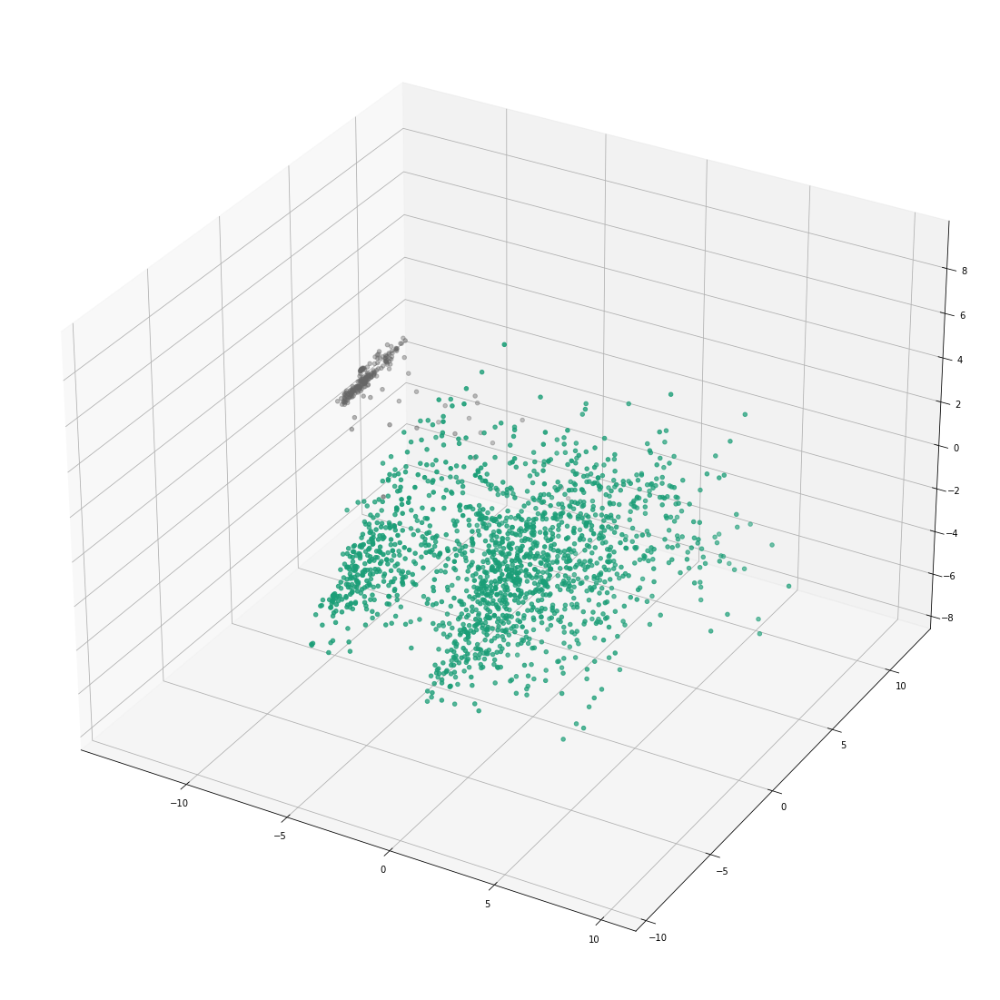

In [39]:
labels = grid_search.best_estimator_.labels_
clustered = (labels >= 0)
    
coverage = np.sum(clustered) / x_compressed.shape[0]
total_clusters = np.max(labels) + 1
cluster_sizes = np.bincount(labels[clustered]).tolist()

print(f"Percent of data retained: {coverage}")
print(f"Total Clusters found: {total_clusters}")
print(f"Cluster splits: {cluster_sizes}")

%matplotlib inline
fig = plt.figure(figsize=(30,20))
ax = fig.add_subplot(111, projection = '3d')
ax.scatter(x_compressed[clustered, 0],x_compressed[clustered, 1],x_compressed[clustered,2],c=labels[clustered],cmap=cm.Dark2)




In [42]:
f"{grid_search.best_estimator_.relative_validity_:.8f}"

'0.00000242'

In [62]:
[i for i in data_orginal.columns if "depaul" in i]

['depaul_0',
 'depaul_1',
 'depaul_2',
 'depaul_3',
 'depaul_4',
 'depaul_5',
 'depaul_6',
 'depaul_7',
 'depaul_8',
 'depaul_9',
 'depaul_10',
 'depaul_11',
 'depaul_12',
 'depaul_13',
 'persistent_fatigue_depaul',
 'headaches_depaul',
 'fatigue_duration_depaul',
 'MEC_diagnosis_depaul',
 'MEC_diagnosis_year_depaul',
 'diagnosis_type_depaul',
 'diagnosis_by_depaul',
 'current_MEC_diagnosis_depaul',
 'family_MEC_diagnosis_depaul']

In [65]:
data_orginal["cluster"].value_counts()

 1    1936
-1     265
 2     234
 0       6
Name: cluster, dtype: int64

In [66]:
depaul_columns=[]
for col in data_orginal.columns:
    if 'mos' in col:
        depaul_columns.append(col)
depaul_columns=depaul_columns[:14]
col_rename={}
for i in depaul_columns:
    j=f"depaul{i[3:]}"
    col_rename[i]=j
data_orginal.rename(columns=col_rename,inplace=True)
data_orginal["depaul_score"]=data["depaul_one_hundred_point"]
data_orginal.to_csv("cleaned_clusterd_new.csv",index=False)